In [1]:
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline
import pandas as pd
from rubin_sim.maf import radar
import os

from matplotlib.legend_handler import HandlerErrorbar

In [2]:
def norm_df(
    df,
    runs,
    cols,
    norm_run="baseline",
    invert_cols=None,
    reverse_cols=None,
    run_label="run_name",
    mag_cols=[],
):
    """
    Normalize values in a dataframe to a given run
    Parameters
    ----------
    df : pandas.DataFrame
        The input data frame
    runs : list of str
        A list of run numes
    cols : list of str
        A list of columns in df to use
    norm_run : str
        The row to use to normalize things to
    invert_cols : list of str
        A list of column names that should be inverted (e.g., columns that
        are uncertainties and are better with a smaller value)
    reverse_cols : list of str
        Columns to reverse (e.g., magnitudes)
    run_label : str (run_name)
        The column that has run names
    mag_cols : list of str
        Columns that are in magnitudes
    """
    indices = [np.max(np.where(df.index == name)[0]) for name in runs]
    out_df = df[cols].iloc[indices].copy()
    if reverse_cols is not None:
        for colname in reverse_cols:
            out_df[colname] = -out_df[colname]
    if invert_cols is not None:
        for colname in invert_cols:
            out_df[colname] = 1.0 / out_df[colname]
    if norm_run is not None:
        indx = np.max(np.where(out_df.index == norm_run)[0])
        for col in out_df.columns:
            # maybe just check that it's not a
            if col != "run_name":
                if (col in mag_cols) | (mag_cols == "all"):
                    out_df[col] = 1.0 + (out_df[col] - out_df[col].iloc[indx])
                else:
                    out_df[col] = (
                        1.0
                        + (out_df[col] - out_df[col].iloc[indx])
                        / out_df[col].iloc[indx]
                    )
    return out_df

In [3]:

data_loaded = pd.read_hdf('summary.h5')
data_loaded.shape

(265, 410027)

In [4]:
#[col for col in data_loaded.columns if 'LVDwarfs' in col]
#[col for col in data_loaded.columns if 'KNePop' in col and 'Total detected' in col and 'ztfrest_simple ' in col and 'DD' in col ]#
[col for col in data_loaded.columns if 'Color' in col and 'Slope' in col]

['Sum ColorSlope visitExposureTime > 19 HealpixSlicer',
 'Sum ColorSlope2Night visitExposureTime > 19 HealpixSlicer']

In [5]:
# Pull out the metrics we are interested in and define simple names

name_dict = {'FootprintFraction N year 1 u and night < 365 HealpixSlicer': 'Y1,u',
            'FootprintFraction N year 1 g and night < 365 HealpixSlicer': 'Y1,g',
            'FootprintFraction N year 1 r and night < 365 HealpixSlicer': 'Y1,r',

            'FootprintFraction N year 1 i and night < 365 HealpixSlicer': 'Y1,i',
    'best18k Parallax fiveSigmaDepth, filter, seeingFwhmGeom, ra_pi_amp, dec_pi_amp HealpixSlicer': 'parallax best 18k',
            'best18k properMotion HealpixSlicer': 'proper motion best 18k',
            'Fraction detected of total (mean) MicrolensingMetric_detect tE 20_30 days UserPointsSlicer': '20-30d microlensing\ndetection',
            'Fraction detected of total (mean) MicrolensingMetric_detect tE 60_90 days UserPointsSlicer': '60-90d microlensing\ndetection',
            'fONv MedianNvis fO HealpixSlicer': 'fO N vis',
            'Total detected SNNSNMetric_reducen_sn DDF excluded HealpixSlicer': 'SNe, N',
             'Median SNNSNMetric_reducezlim DDF excluded HealpixSlicer': 'SNe, zlim',
            '3x2ptFoM Exgalm5WithCuts i band non-DD year 10 HealpixSlicer': '3x2 i-band',
            'Median WeakLensingNvisits gri band non-DD HealpixSlicer': 'WL Nvis \ni-band',
            #'Total detected KNePopMetric_all_ztfrest_simple all models UserPointsSlicer': 'KNe ZTF simple',
            #'Total detected KNePopMetric_single_ztfrest_simple single model UserPointsSlicer': 'KNe single model',
            #'Sum PrestoKNe_score_p UserPointsSlicer': 'KNe Score, P',
            'Sum ColorSlope visitExposureTime > 19 HealpixSlicer': 'color slope',
            "Sum ColorSlope2Night visitExposureTime > 19 HealpixSlicer": "2day\ncolor slope",
            'Total detected XRBPopMetric_early_detect UserPointsSlicer': 'XRB\nearly detect',
            'VolumeSum Brown Dwarf, L7 HealpixSlicer': 'Brown Dwarf Vol',
            'CumulativeCompleteness H <= 16.000000 DiscoveryNChances NEO 3 pairs in 15 nights SNR=3 detection loss MoObjSlicer': 'NEO bright',
            'CumulativeCompleteness H <= 22.000000 DiscoveryNChances NEO 3 pairs in 15 nights SNR=3 detection loss MoObjSlicer': 'NEO faint',
            'CumulativeCompleteness H <= 6.000000 DiscoveryNChances TNO 3 pairs in 15 nights SNR=3 detection loss MoObjSlicer': 'TNO',
            'CumulativeCompleteness H <= 20.000000 DiscoveryNChances MBA 3 pairs in 15 nights SNR=3 detection loss MoObjSlicer': 'MBA',
            'CumulativeCompleteness H <= 18.000000 DiscoveryNChances Trojan 3 pairs in 15 nights SNR=3 detection loss MoObjSlicer': 'Trojan',
            'CumulativeCompleteness H <= 16.000000 DiscoveryNChances Vatira 1 quad in 1 night detection loss MoObjSlicer': 'Vatira',
            'CumulativeCompleteness H <= 20.000000 DiscoveryNChances PHA 1 quad in 1 night detection loss MoObjSlicer': 'PHA, quad'}
            
# drop in the units for the columns
units = {'parallax best 18k': 'mas',
         'proper motion best 18k': 'mas/yr',
         '20-30d microlensing\ndetection': 'fraction', 
         '60-90d microlensing\ndetection': 'fraction', 
         'fO N vis' : '', 
         'SNe, N': '', 
         'SNe, zlim': '', 
         '3x2 i-band': 'score', 
         'WL Nvis \ni-band': '', 
         'KNe ZTF simple': 'N', 
         'KNe single model': 'N',
         'KNe Score, P': 'score',
         'XRB\nearly detect': 'N', 
         'Brown Dwarf Vol': 'pc^3', 
         'NEO bright': 'fraction', 
         'NEO faint': 'fraction', 
         'TNO': 'fraction', 
         'MBA':'fraction',
         'Trojan': 'fraction',
         'Vatira': 'fraction',
         'PHA, quad': 'fraction',
         'Y1,u': '',
         'Y1,g': '',
         'Y1,r': '',
         'Y1,i': '',
         'color slope': 'N',
         '2day\ncolor slope': 'N',
        }

# If columns are uncertainties, we want to plot them backwards
invert_cols = ['parallax best 18k', 'proper motion best 18k']
# If columns are mags or fractions, we want to plot differences, not fractional differences.
mag_cols = ['20-30d microlensing\ndetection', '60-90d microlensing\ndetection','SNe, zlim',
            'NEO bright', 'NEO faint', 'TNO', 'Vatira', 'MBA', 'Trojan',
           'u', 'g', 'r', 'i', 'z', 'y']

data = pd.DataFrame()
for key in name_dict:
    data[name_dict[key]] = data_loaded[key]
    

mag_dict = {'Median CoaddM5 g HealpixSlicer': 'g',
 'Median CoaddM5 i HealpixSlicer': 'i',
 'Median CoaddM5 r HealpixSlicer': 'r',
 'Median CoaddM5 u HealpixSlicer': 'u',
 'Median CoaddM5 y HealpixSlicer': 'y',
 'Median CoaddM5 z HealpixSlicer': 'z'}

mag_data = pd.DataFrame()
for key in mag_dict:
    mag_data[mag_dict[key]] = data_loaded[key]
    
    
    
ddf_dict = {'Sum SNNSNMetric DD:COSMOS_reducen_sn DD:COSMOS all bands, only DDF observations HealpixSubsetSlicer' : 'N SN COSMOS',
           'Sum SNNSNMetric DD:ECDFS_reducen_sn DD:ECDFS all bands, only DDF observations HealpixSubsetSlicer' : 'N SN ECDFS',
           'Sum SNNSNMetric DD:EDFS_reducen_sn DD:EDFS all bands, only DDF observations HealpixSubsetSlicer' : 'N SN EDFS',
           'Sum SNNSNMetric DD:ELAISS1_reducen_sn DD:ELAISS1 all bands, only DDF observations HealpixSubsetSlicer' : 'N SN ELAISS1',
           'Sum SNNSNMetric DD:XMM_LSS_reducen_sn DD:XMM_LSS all bands, only DDF observations HealpixSubsetSlicer' : 'N SN XMM_LSS',
            
           'Median SNNSNMetric DD:COSMOS_reducezlim DD:COSMOS all bands, only DDF observations HealpixSubsetSlicer': 'zlim COSMOS',
            'Median SNNSNMetric DD:ECDFS_reducezlim DD:ECDFS all bands, only DDF observations HealpixSubsetSlicer': 'zlim ECDFS',
            'Median SNNSNMetric DD:EDFS_reducezlim DD:EDFS all bands, only DDF observations HealpixSubsetSlicer': 'zlim EDFS',
            'Median SNNSNMetric DD:ELAISS1_reducezlim DD:ELAISS1 all bands, only DDF observations HealpixSubsetSlicer': 'zlim ELAISS1',
            'Median SNNSNMetric DD:XMM_LSS_reducezlim DD:XMM_LSS all bands, only DDF observations HealpixSubsetSlicer': 'zlim XMM_LSS',
            
           'Total detected KNePopMetric_DD:COSMOS_ztfrest_simple DD:COSMOS UserPointsSlicer': 'Kne COSMOS',
         'Total detected KNePopMetric_DD:ECDFS_ztfrest_simple DD:ECDFS UserPointsSlicer': 'Kne ECDFS',
 'Total detected KNePopMetric_DD:EDFS_ztfrest_simple DD:EDFS UserPointsSlicer': 'Kne EDFS',
 'Total detected KNePopMetric_DD:ELAISS1_ztfrest_simple DD:ELAISS1 UserPointsSlicer': 'Kne ELAISS1',
 'Total detected KNePopMetric_DD:WFD_ztfrest_simple DD:WFD UserPointsSlicer': 'Kne WFD',
 'Total detected KNePopMetric_DD:XMM_LSS_ztfrest_simple DD:XMM_LSS UserPointsSlicer': 'Kne XMM_LSS',
            
            'Median DD:COSMOS NVisits all bands HealpixSubsetSlicer':'N COSMOS',
 'Median DD:ECDFS NVisits all bands HealpixSubsetSlicer': 'N ECDFS',
 'Median DD:EDFS NVisits all bands HealpixSubsetSlicer': 'N EDFS',
 'Median DD:ELAISS1 NVisits all bands HealpixSubsetSlicer': 'N ELAISS1',
 'Median DD:WFD NVisits all bands HealpixSubsetSlicer': 'N WFD',
 'Median DD:XMM_LSS NVisits all bands HealpixSubsetSlicer': 'N XMM_LSS', 
           }

ddf_data = pd.DataFrame()
for key in ddf_dict:
    ddf_data[ddf_dict[key]] = data_loaded[key]
 
gaps_dict = {}
for filtername in 'ugrizy':
    for times in [3,7,24]:
        gaps_dict['Mean N gaps in %s at %ihr in top 18k Gaps_%ihr %s band HealpixSlicer'% (filtername, times, times, filtername)] = 'gaps %s %i' % (filtername, times)
        #gaps_dict['Mean Gaps_%ihr %s band HealpixSlicer' % (times, filtername)] = 'gaps %s %i' % (filtername, times)
        
gaps_data = pd.DataFrame()
for key in gaps_dict:
    gaps_data[gaps_dict[key]] = data_loaded[key]

In [6]:
data['XRB\nearly detect']['baseline_v3.4_10yrs'], data['XRB\nearly detect']['early_u_fpextra3.0_v3.4_10yrs']


(2043.0, 2122.0)

In [7]:
data_loaded["Total detected XRBPopMetric_early_detect UserPointsSlicer"]


all_long_v3.4_10yrs            1989.0
baseline_v2.0_10yrs            1882.0
baseline_v2.1_10yrs            1918.0
baseline_v2.2_10yrs            1921.0
baseline_v3.0_10yrs            1952.0
                                ...  
weather_cloudso35v3.4_10yrs    2086.0
weather_cloudso36v3.4_10yrs    2123.0
weather_cloudso4v3.4_10yrs     2108.0
weather_cloudso6v3.4_10yrs     2147.0
weather_cloudso8v3.4_10yrs     2152.0
Name: Total detected XRBPopMetric_early_detect UserPointsSlicer, Length: 265, dtype: float64

In [8]:
[run for run in data.index if 'early' in run]

['early_template_fpextra1.5_v3.4_10yrs',
 'early_template_fpextra2.0_v3.4_10yrs',
 'early_template_fpextra3.0_v3.4_10yrs',
 'early_template_fpextra5.0_v3.4_10yrs',
 'early_u_fpextra2.0_v3.4_10yrs',
 'early_u_fpextra3.0_v3.4_10yrs',
 'early_u_fpextra4.0_v3.4_10yrs',
 'roll_uniform_early_half_accordion1_mjdp0_v3.4_10yrs',
 'roll_uniform_early_half_mjdp0_v3.4_10yrs',
 'roll_uniform_early_half_mjdp180_v3.4_10yrs',
 'roll_uniform_early_half_mjdp253_v3.4_10yrs',
 'roll_uniform_early_half_mjdp67_v3.4_10yrs']

In [9]:
#data['KNe single model'] # data['KNe ZTF simple']

In [10]:
# A bit of a mystery why baseline_v3.0_10yrs is so much better. 
# The KNe ZTF simple and KNe single model don't seem to
# be particularly well correlated. Seems like it has to be an MJD_start bug somewhere, but I can't find it.
#data['KNe ZTF simple']

In [11]:
mag_data

,g,i,r,u,y,z
all_long_v3.4_10yrs,NaN,NaN,NaN,NaN,NaN,NaN
baseline_v2.0_10yrs,NaN,NaN,NaN,NaN,NaN,NaN
baseline_v2.1_10yrs,NaN,NaN,NaN,NaN,NaN,NaN
baseline_v2.2_10yrs,NaN,NaN,26.83543,NaN,24.782743,NaN
baseline_v3.0_10yrs,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
weather_cloudso35v3.4_10yrs,NaN,NaN,NaN,NaN,NaN,NaN
weather_cloudso36v3.4_10yrs,NaN,NaN,NaN,NaN,NaN,NaN
weather_cloudso4v3.4_10yrs,NaN,NaN,NaN,NaN,NaN,25.77012
weather_cloudso6v3.4_10yrs,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
ddf_data
#ddf_data = ddf_data.reindex(new_ind)

,N SN COSMOS,N SN ECDFS,N SN EDFS,N SN ELAISS1,N SN XMM_LSS,zlim COSMOS,zlim ECDFS,zlim EDFS,zlim ELAISS1,zlim XMM_LSS,...,Kne EDFS,Kne ELAISS1,Kne WFD,Kne XMM_LSS,N COSMOS,N ECDFS,N EDFS,N ELAISS1,N WFD,N XMM_LSS
all_long_v3.4_10yrs,987.315354,851.049522,1515.003534,798.808515,827.798189,0.516848,0.565924,0.504254,0.513191,0.513753,...,574.0,482.0,414.0,450.0,18662.5,10470.0,6686.0,9850.0,858.0,10105.0
baseline_v2.0_10yrs,638.253284,586.826209,974.231557,684.401547,611.229060,0.503926,0.485978,0.481621,0.508870,0.490990,...,365.0,423.0,298.0,317.0,8937.5,9264.0,5497.0,9262.0,833.0,9024.0
baseline_v2.1_10yrs,548.479625,545.669910,875.981802,636.634918,520.071105,0.496150,0.484905,0.474738,0.501027,0.480094,...,373.0,384.0,289.0,325.0,8900.0,9166.5,5506.0,9127.0,820.0,8941.0
baseline_v2.2_10yrs,708.239238,685.202422,1067.553931,674.561648,611.247120,0.493897,0.495572,0.466223,0.488264,0.484132,...,425.0,370.0,327.0,304.0,9853.0,9663.0,6150.0,9991.0,829.0,9869.0
baseline_v3.0_10yrs,955.159293,799.584601,1266.961769,688.808879,726.491723,0.503734,0.521961,0.464010,0.500330,0.484669,...,428.0,405.0,339.0,340.0,18716.5,10606.5,6668.0,10671.0,817.0,10845.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
weather_cloudso35v3.4_10yrs,931.201159,809.597913,1379.044260,777.300267,734.947313,0.548710,0.535488,0.496629,0.510424,0.497228,...,572.0,479.0,423.0,417.0,19240.5,9827.0,6115.0,9723.0,908.0,9586.0
weather_cloudso36v3.4_10yrs,971.367562,773.848626,1391.251789,827.270250,832.244000,0.550022,0.544726,0.502587,0.489120,0.505490,...,537.0,503.0,416.0,435.0,19501.0,9520.5,5864.0,9921.0,918.0,9905.0
weather_cloudso4v3.4_10yrs,999.605374,851.867808,1640.412837,855.877115,930.847858,0.537376,0.559896,0.512214,0.515553,0.518643,...,609.0,524.0,449.0,468.0,19240.5,10418.0,6539.0,10001.0,924.0,10166.0
weather_cloudso6v3.4_10yrs,999.888886,871.682608,1701.222170,898.212537,929.571852,0.546925,0.562375,0.508507,0.522198,0.504127,...,671.0,540.0,447.0,488.0,19865.5,10121.0,6553.0,10232.0,931.0,10511.0


In [13]:
gaps_data

,gaps u 3,gaps u 7,gaps u 24,gaps g 3,gaps g 7,gaps g 24,gaps r 3,gaps r 7,gaps r 24,gaps i 3,gaps i 7,gaps i 24,gaps z 3,gaps z 7,gaps z 24,gaps y 3,gaps y 7,gaps y 24
all_long_v3.4_10yrs,0.113256,0.059635,3.816851,0.174243,0.157411,4.636639,4.032732,3.550473,20.404905,3.397445,2.949783,19.411060,2.885812,2.296219,15.708677,1.075069,0.377069,13.291463
baseline_v2.0_10yrs,0.559565,0.096983,2.681121,0.501515,0.060381,4.151443,2.579755,0.452371,17.055252,2.086213,0.422810,15.289504,2.832937,0.465706,18.134005,2.181890,0.218119,10.919662
baseline_v2.1_10yrs,0.601110,0.097077,2.961440,0.621392,0.080291,4.104024,2.708024,0.389565,18.103231,2.217187,0.366019,16.026064,3.008206,0.484776,18.327179,2.477409,0.206229,10.257798
baseline_v2.2_10yrs,0.633655,0.187066,3.622465,0.399776,0.051569,4.466172,1.834849,0.314636,19.672775,1.433580,0.276449,16.984520,2.238075,0.408775,20.773395,1.377629,0.186833,8.640323
baseline_v3.0_10yrs,0.257192,0.257425,3.984706,0.213736,0.363687,3.787056,1.069054,1.779876,20.989882,1.293328,1.973516,18.047932,1.569590,1.366578,22.387886,0.725976,0.211312,9.392083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
weather_cloudso35v3.4_10yrs,0.184455,0.101366,4.178393,0.200214,0.127617,4.756609,1.779736,1.525202,25.156292,1.703269,1.066023,21.343778,1.225020,0.806873,19.403087,1.471068,0.617616,16.143983
weather_cloudso36v3.4_10yrs,0.211498,0.118851,3.977713,0.198116,0.152889,4.558959,1.885485,1.503847,25.169907,1.534527,0.999067,21.828041,1.119690,0.803516,19.293794,1.410967,0.581200,16.243717
weather_cloudso4v3.4_10yrs,0.195692,0.122488,3.865342,0.212011,0.163613,4.511773,1.980230,1.521378,25.140859,1.616030,0.850329,21.654404,1.192847,0.779550,19.186739,1.470975,0.610202,16.145568
weather_cloudso6v3.4_10yrs,0.187066,0.117825,4.292488,0.187066,0.148366,4.941064,1.819089,1.489253,26.936355,1.793957,1.107801,22.493262,1.402993,1.002798,20.438663,1.598219,0.646431,17.482585


In [14]:
#runs = [run for run in data.index ]
#ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
#                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
#fig, ax = radar(ndata, legend=True, rgrids=[0.8, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

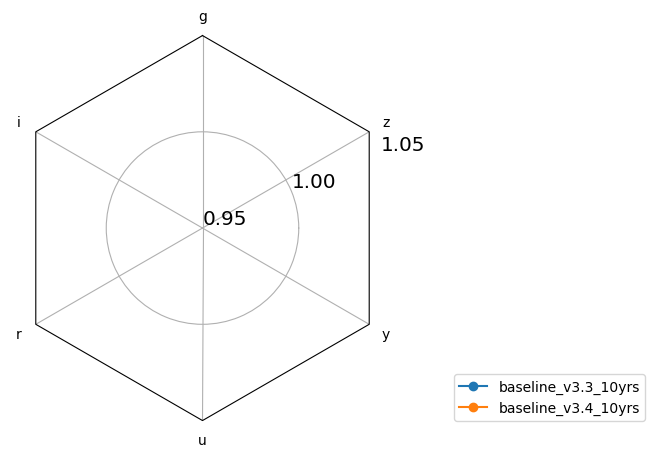

In [15]:
runs = ['baseline_v3.3_10yrs', 'baseline_v3.4_10yrs' ]
ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.3_10yrs')#, invert_cols=['u', 'g', 'r', 'i', 'z', 'y'])
fig, ax = radar(ndata, legend=True, rgrids=[0.95, 1.0, 1.05], bbox_to_anchor=(1.65, 0))

In [16]:
#runs = [ run for run in data.index if '3.4' in run]
#ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
#                 mag_cols = mag_cols, norm_run='initial_v3.4_10yrs')
#fig, ax = radar(ndata, legend=True, rgrids=[0.90, 1.0, 1.2], bbox_to_anchor=(1.65, 0))

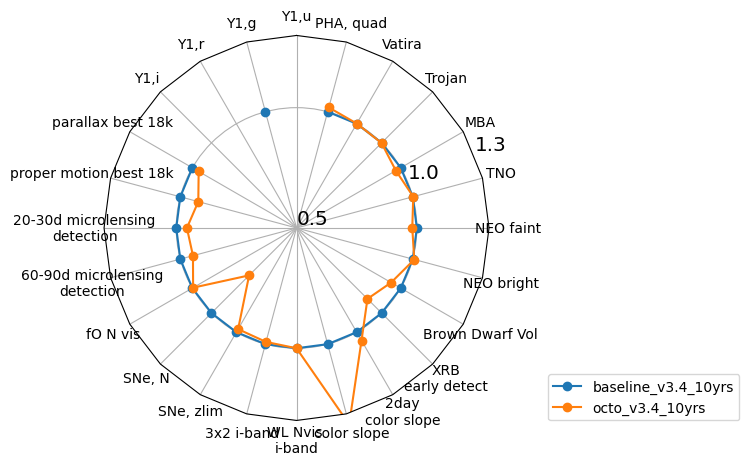

In [17]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index  if 'octo' in run]
ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.5, 1.0, 1.3], bbox_to_anchor=(1.65, 0))

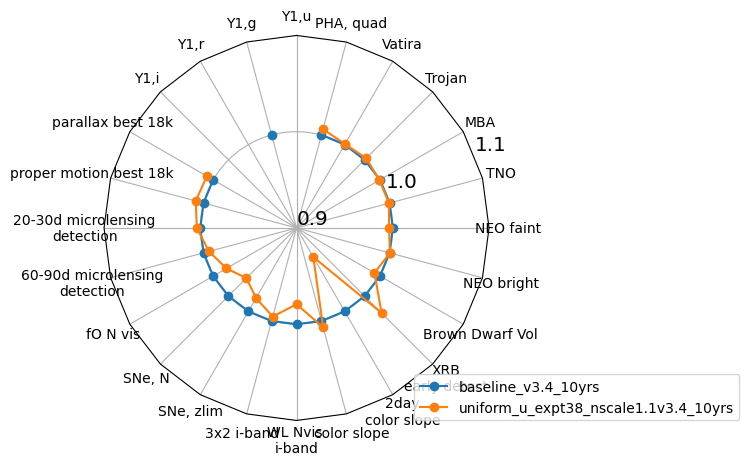

In [18]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index  if 'uniform_u_expt38_nscale1.1v3.4_10yrs' in run]
ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

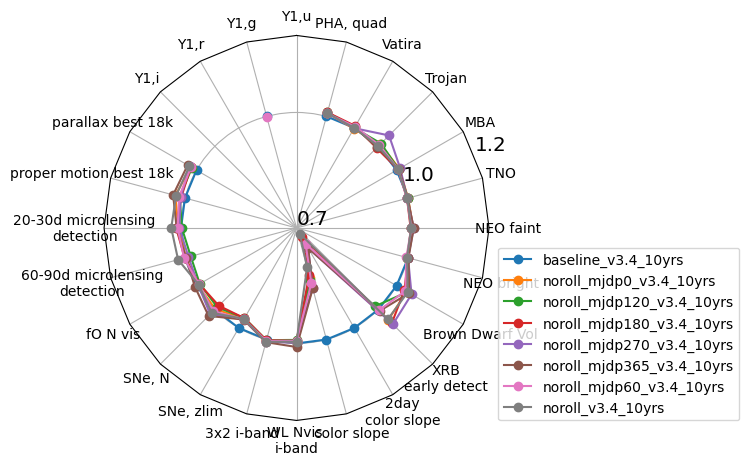

In [19]:
runs = [run for run in data.index if 'baseline_v3.4' in run or 'noroll' in run]
ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.7, 1.0, 1.2], bbox_to_anchor=(1.65, 0))

In [20]:
ndata

,"Y1,u","Y1,g","Y1,r","Y1,i",parallax best 18k,proper motion best 18k,20-30d microlensing\ndetection,60-90d microlensing\ndetection,fO N vis,"SNe, N",...,2day\ncolor slope,XRB\nearly detect,Brown Dwarf Vol,NEO bright,NEO faint,TNO,MBA,Trojan,Vatira,"PHA, quad"
baseline_v3.4_10yrs,NaN,1.000000,NaN,NaN,1.000000,1.000000,1.0000,1.0000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.0000,1.000000,1.000000,1.000000,1.000000,1.0000,1.000000
noroll_mjdp0_v3.4_10yrs,NaN,NaN,NaN,NaN,1.017122,1.025960,1.0070,0.9971,0.996328,0.998202,...,0.756650,1.037200,1.030536,0.9976,1.003205,0.999807,1.008294,1.007601,0.9976,1.009491
noroll_mjdp120_v3.4_10yrs,NaN,NaN,NaN,NaN,1.013450,1.014127,0.9979,0.9845,0.990208,0.991169,...,0.749745,0.987763,1.032804,0.9976,0.998147,0.999741,1.005868,1.010223,0.9999,1.010676
noroll_mjdp180_v3.4_10yrs,NaN,NaN,NaN,NaN,1.016763,1.009974,1.0126,1.0007,0.991432,0.985667,...,0.727019,1.049927,1.023537,1.0004,0.996325,0.997154,1.004674,0.993749,1.0058,1.010657
noroll_mjdp270_v3.4_10yrs,NaN,NaN,NaN,NaN,1.020230,1.011630,1.0044,0.9906,0.995104,1.017104,...,0.760027,1.053842,1.044973,0.9998,1.004498,0.997923,1.010721,1.039781,0.9993,1.008382
noroll_mjdp365_v3.4_10yrs,NaN,NaN,NaN,NaN,1.026507,1.031840,1.0114,0.9974,1.004896,1.023114,...,0.760643,1.004895,1.038113,1.0010,1.004449,0.997968,1.007495,0.995609,1.0020,1.009364
noroll_mjdp60_v3.4_10yrs,NaN,0.999109,NaN,NaN,1.016370,1.015627,1.0089,1.0024,0.992656,1.005677,...,0.747078,1.002937,1.026736,0.9952,0.998393,0.996666,1.005163,1.004288,1.0039,1.007790
noroll_v3.4_10yrs,NaN,NaN,NaN,NaN,1.021101,1.024061,1.0254,1.0185,0.993880,1.011497,...,0.717232,1.035242,1.033694,0.9972,0.997764,0.997766,1.004688,1.000314,1.0002,1.008414


In [21]:
# Look at difference between cluster and Apple chips
#runs = ['baseline_v3.4_10yrs', 'm2_baseline_v3.4_10yrs' ]
#ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
#                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
#fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.2], bbox_to_anchor=(1.65, 0))

In [22]:
# One snap
#runs = ['baseline_v3.4_10yrs', 'onesnap_v3.4_10yrs' ]
#ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
#                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
#fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.2], bbox_to_anchor=(1.65, 0))

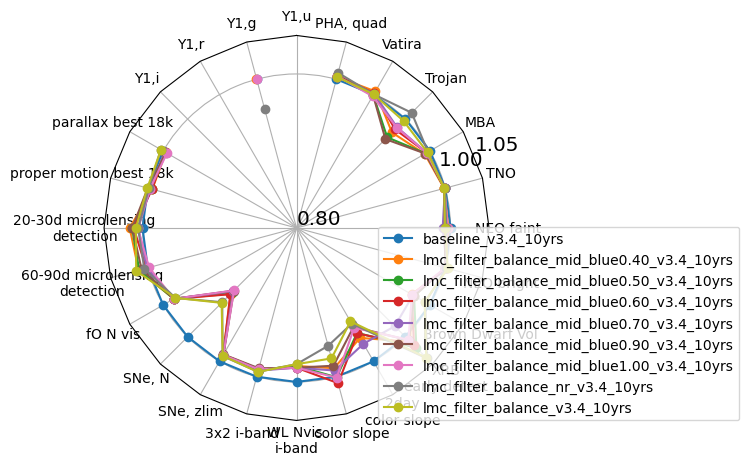

In [23]:
# 
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'lmc' in run]
ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.80, 1.0, 1.05], bbox_to_anchor=(1.65, 0))

In [24]:
ndata

,"Y1,u","Y1,g","Y1,r","Y1,i",parallax best 18k,proper motion best 18k,20-30d microlensing\ndetection,60-90d microlensing\ndetection,fO N vis,"SNe, N",...,2day\ncolor slope,XRB\nearly detect,Brown Dwarf Vol,NEO bright,NEO faint,TNO,MBA,Trojan,Vatira,"PHA, quad"
baseline_v3.4_10yrs,NaN,1.000000,NaN,NaN,1.000000,1.000000,1.0000,1.0000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.0000,1.000000,1.000000,1.000000,1.000000,1.0000,1.000000
lmc_filter_balance_mid_blue0.40_v3.4_10yrs,NaN,1.000891,NaN,NaN,0.996108,0.994021,1.0167,1.0123,0.984088,0.920869,...,0.964873,1.008811,0.972821,1.0010,0.996975,0.998465,0.992249,0.975354,1.0048,1.003144
lmc_filter_balance_mid_blue0.50_v3.4_10yrs,NaN,NaN,NaN,NaN,0.997902,0.994687,1.0136,1.0115,0.984088,0.917234,...,0.957316,1.020069,0.976234,1.0002,0.992386,1.000084,0.993624,0.966479,0.9993,1.004947
lmc_filter_balance_mid_blue0.60_v3.4_10yrs,NaN,NaN,NaN,NaN,0.997150,0.994296,1.0115,1.0021,0.984088,0.921707,...,0.958168,1.015663,0.972906,1.0024,0.992769,0.998683,0.995335,0.981036,1.0019,1.004838
lmc_filter_balance_mid_blue0.70_v3.4_10yrs,NaN,NaN,NaN,NaN,0.997777,0.996381,1.0057,1.0011,0.984088,0.916156,...,0.973717,0.980421,0.974626,1.0024,0.989798,0.999522,0.995320,0.984804,1.0012,1.003216
lmc_filter_balance_mid_blue0.90_v3.4_10yrs,NaN,NaN,NaN,NaN,0.995717,1.000029,1.0133,1.0083,0.984088,0.915144,...,0.948238,1.006363,0.976581,1.0000,0.992648,0.998982,0.993166,0.963197,0.9990,1.004619
lmc_filter_balance_mid_blue1.00_v3.4_10yrs,NaN,1.000000,NaN,NaN,0.994348,0.996893,1.0062,0.9982,0.984088,0.914735,...,0.949670,1.005384,0.973133,1.0000,0.996262,0.999030,0.995060,0.984201,0.9975,1.004167
lmc_filter_balance_nr_v3.4_10yrs,NaN,0.959750,NaN,NaN,1.003552,0.998466,1.0058,1.0047,0.981640,0.936417,...,0.943510,1.039648,0.992966,1.0016,0.994612,0.999072,0.997192,1.011488,1.0004,1.008610
lmc_filter_balance_v3.4_10yrs,NaN,NaN,NaN,NaN,1.003202,1.000617,1.0087,1.0156,0.981640,0.937570,...,0.940113,1.038179,0.992050,1.0034,0.992726,0.998539,0.996416,0.996504,1.0004,1.003048


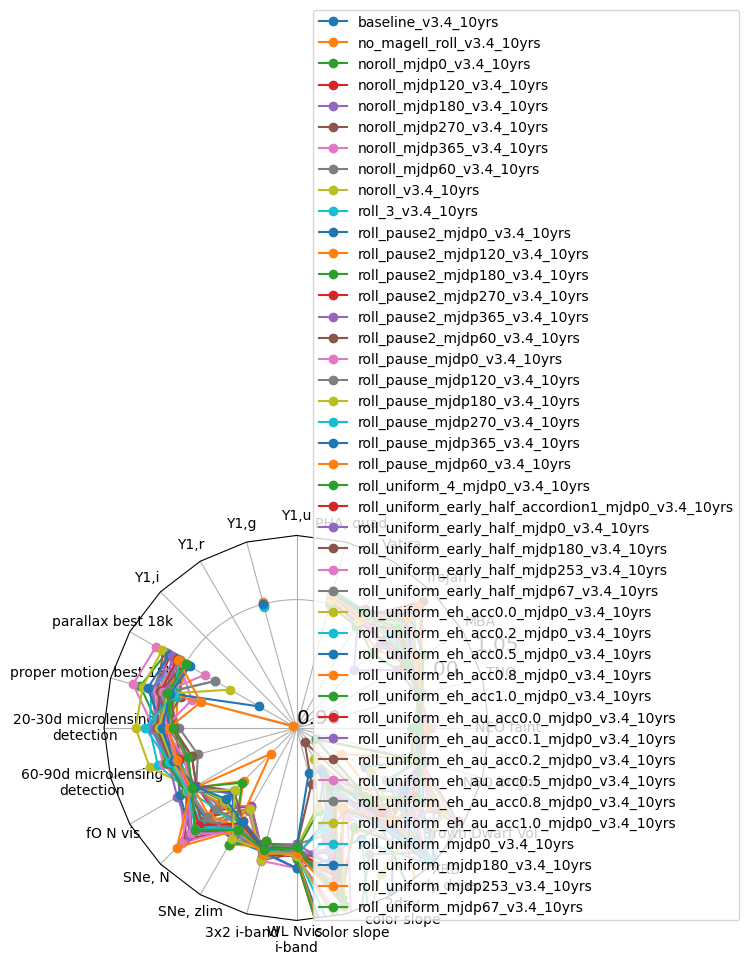

In [25]:
# various rolling
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'roll' in run]
ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.90, 1.0, 1.05], bbox_to_anchor=(1.65, 0))

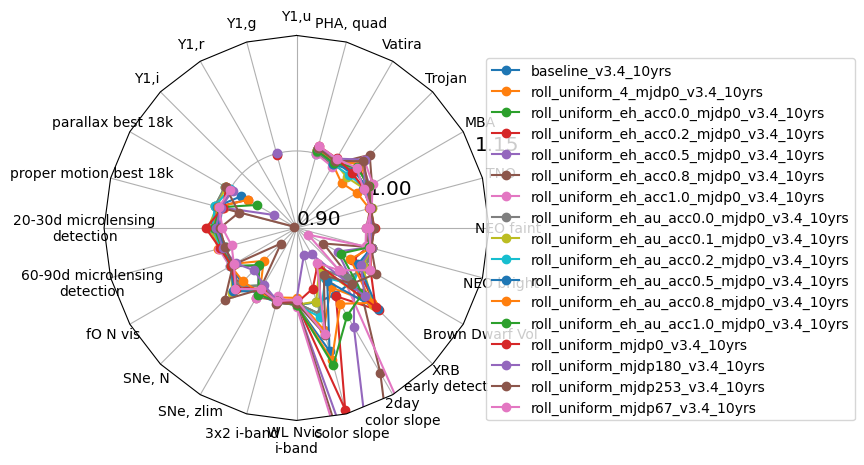

In [26]:
# various rolling
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'roll' in run and 'half' not in run and 'uniform' in run]
ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.15], bbox_to_anchor=(1.95, 0))

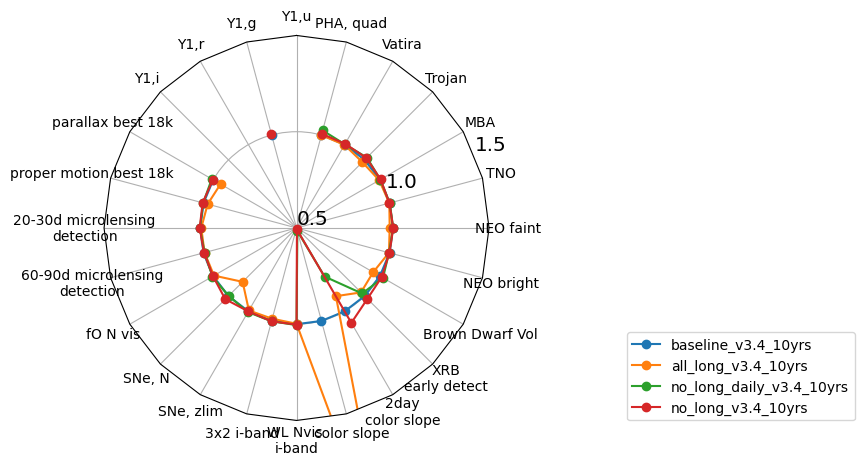

In [27]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'long' in run]
ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.5, 1.0, 1.5], bbox_to_anchor=(1.95, 0))

In [28]:


times = ['retro_baseline_v2.0_10yrs', 'baseline_v2.0_10yrs', 'baseline_v2.1_10yrs', 'baseline_v2.2_10yrs',
        'baseline_v3.0_10yrs',  'baseline_v3.2_10yrs', 'baseline_v3.3_10yrs', 'baseline_v3.4_10yrs', 'roll_uniform_early_half_mjdp0_v3.4_10yrs']

sub_data = data.reindex(labels=times)
sub_ddf = ddf_data.reindex(labels=times)
sub_mag = mag_data.reindex(labels=times)
sub_gaps = gaps_data.reindex(labels=times)
sub_data



,"Y1,u","Y1,g","Y1,r","Y1,i",parallax best 18k,proper motion best 18k,20-30d microlensing\ndetection,60-90d microlensing\ndetection,fO N vis,"SNe, N",...,2day\ncolor slope,XRB\nearly detect,Brown Dwarf Vol,NEO bright,NEO faint,TNO,MBA,Trojan,Vatira,"PHA, quad"
retro_baseline_v2.0_10yrs,NaN,NaN,NaN,NaN,0.804364,0.176701,0.0878,0.1568,848.0,97124.012102,...,1072605.0,720.0,179634.826127,0.9048,0.624144,0.705922,0.943673,0.667514,0.0000,0.847855
baseline_v2.0_10yrs,NaN,NaN,NaN,NaN,0.791090,0.184088,0.3119,0.4348,839.0,99302.532220,...,1283741.0,1882.0,168080.497664,0.9294,0.642165,0.719712,0.919119,0.588234,0.0039,0.859388
baseline_v2.1_10yrs,NaN,NaN,NaN,NaN,0.806946,0.188258,0.3141,0.4319,838.0,99294.339899,...,1277085.0,1918.0,163809.598961,0.9286,0.647818,0.723396,0.927584,0.609144,0.0017,0.865595
baseline_v2.2_10yrs,NaN,NaN,NaN,NaN,0.792998,0.186345,0.3268,0.4487,830.0,112802.099640,...,1408541.0,1921.0,172447.199022,0.9304,0.657736,0.723964,0.933674,0.615614,0.0008,0.858646
baseline_v3.0_10yrs,NaN,NaN,NaN,NaN,0.792704,0.185683,0.3232,0.4528,795.0,109475.798536,...,1528234.0,1952.0,168026.998037,0.9326,0.642444,0.722371,0.924274,0.611475,0.0376,0.888025
baseline_v3.2_10yrs,NaN,0.984525,NaN,NaN,0.782553,0.185369,0.3437,0.4869,805.0,123176.659086,...,1436743.0,2048.0,174046.841812,0.9460,0.642240,0.720853,0.926557,0.589189,0.4628,0.893770
baseline_v3.3_10yrs,NaN,NaN,NaN,NaN,0.753860,0.179042,0.3817,0.5233,811.0,152910.228661,...,1492778.0,2090.0,188214.630011,0.9442,0.659856,0.722551,0.942687,0.630071,0.4606,0.906586
baseline_v3.4_10yrs,NaN,0.992336,NaN,NaN,0.752667,0.177617,0.3653,0.5179,817.0,151098.440513,...,1559032.0,2043.0,188718.767448,0.9478,0.667858,0.727785,0.943605,0.634531,0.4634,0.904225
roll_uniform_early_half_mjdp0_v3.4_10yrs,NaN,NaN,NaN,NaN,0.743415,0.176839,0.3720,0.5095,810.0,146976.889338,...,1460950.0,2079.0,190180.277431,0.9490,0.659999,0.726921,0.933977,0.597857,0.4586,0.910145


/var/folders/jv/jdhmc2t93njct5cx375mztcr0000gn/T/ipykernel_63699/3763499284.py:26: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "s" (-> marker='s'). The keyword argument will take precedence.
  h0 = ax.errorbar(np.arange(sub_data[col].values.size), sub_data[col], yerr=std_dict[col], fmt='s', color='k',


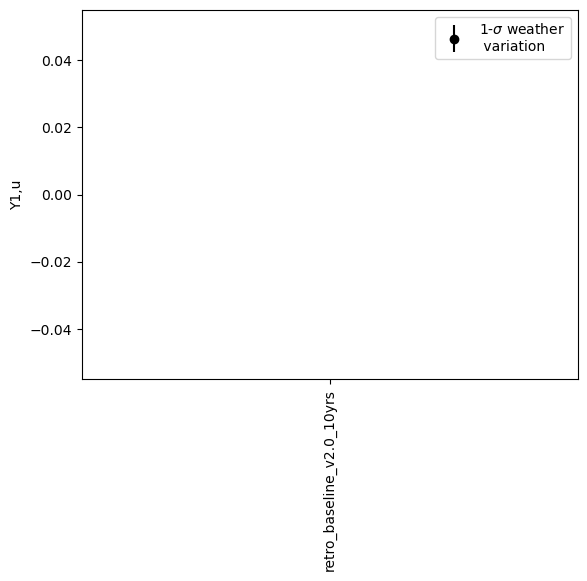

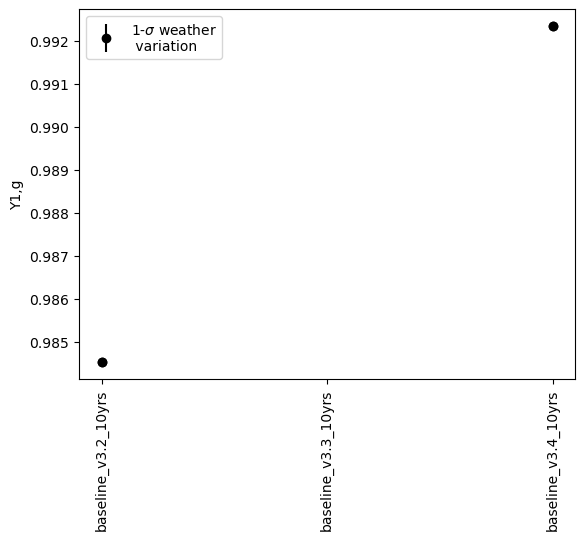

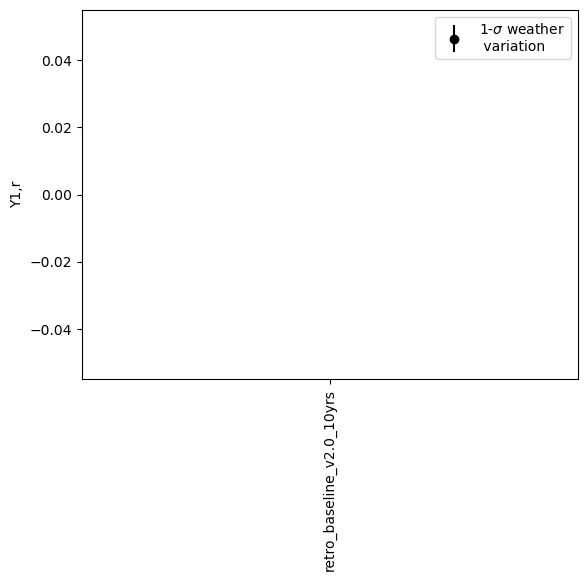

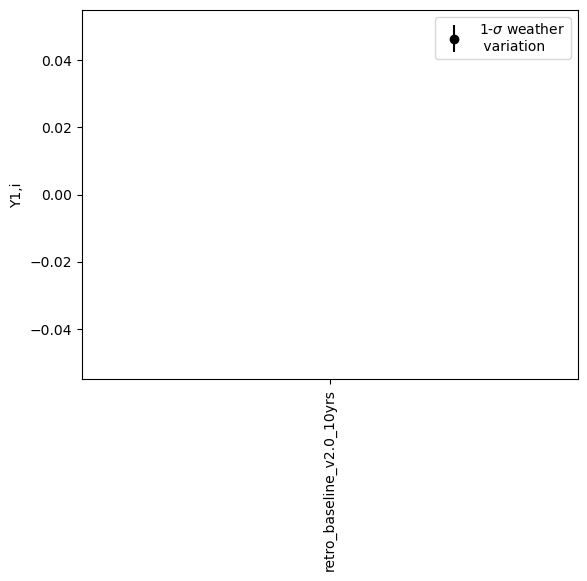

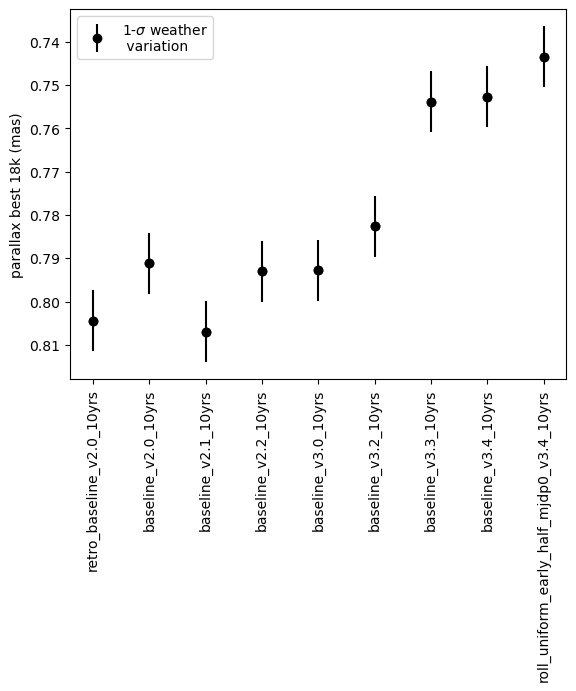

...

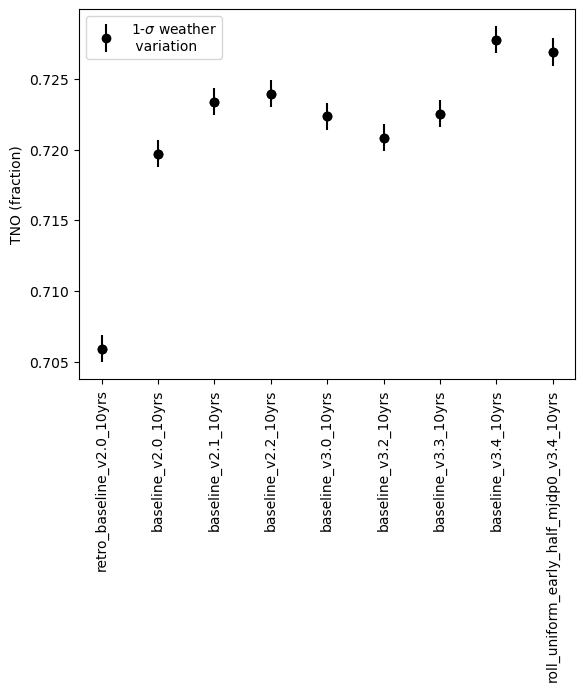

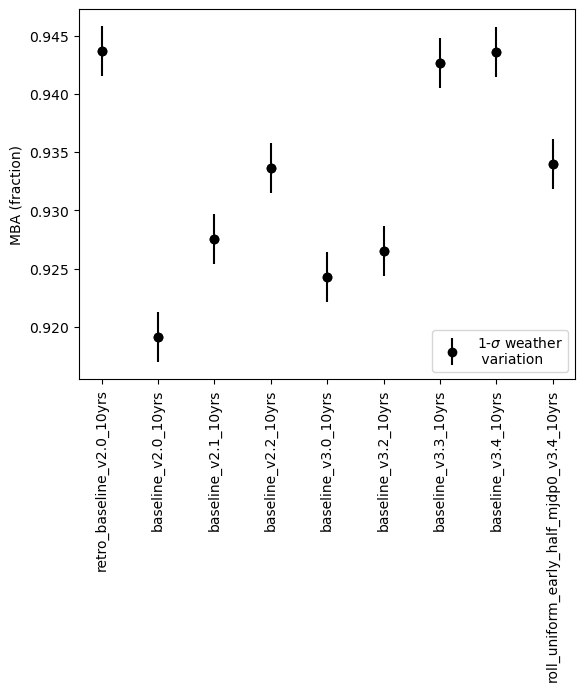

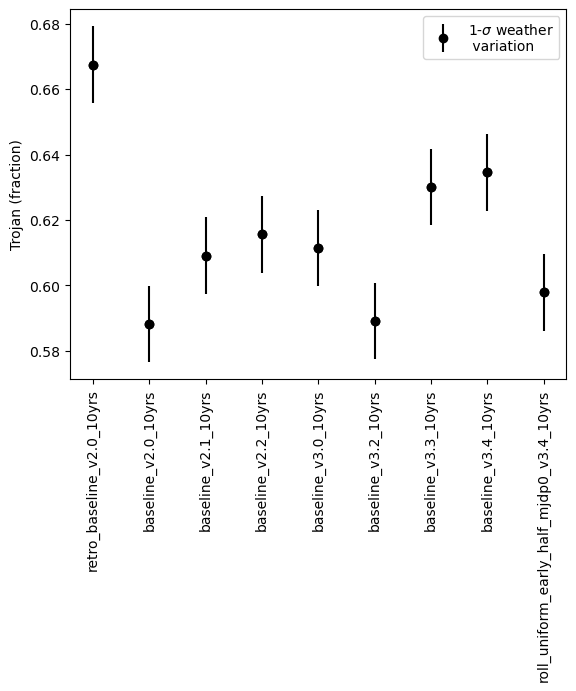

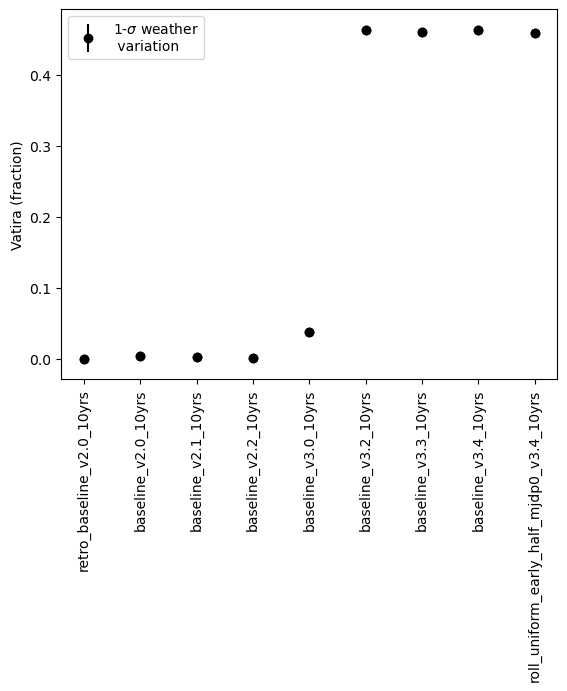

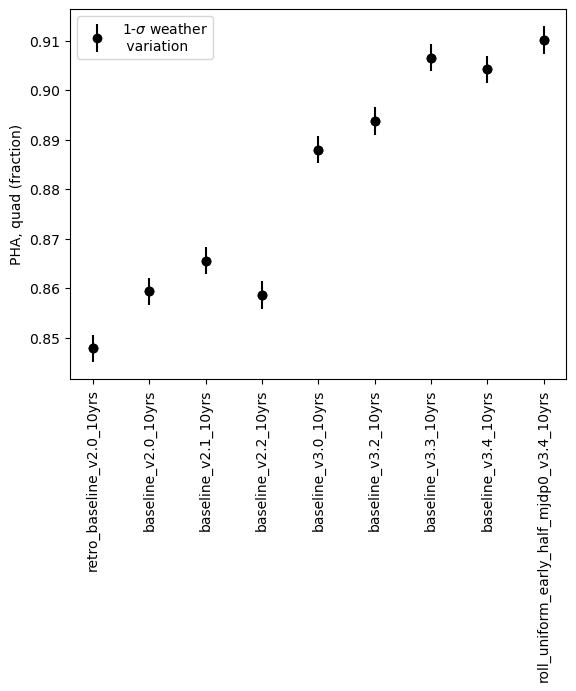

In [29]:
# Rough error bars from weather simulations
std_dict = {}
weather_runs = [run for run in data.index if 'weather' in run]
for col in data.columns:
    std_dict[col] = np.std(data.loc[weather_runs][col])

std_mag_dict = {}
for col in mag_data.columns:
    std_mag_dict[col] = np.std(mag_data.loc[weather_runs][col])
    
std_ddf_dict = {}
for col in ddf_data.columns:
    std_ddf_dict[col] = np.std(ddf_data.loc[weather_runs][col])
 

std_gaps_dict = {}
for col in gaps_data.columns:
    std_gaps_dict[col] = np.std(gaps_data.loc[weather_runs][col])


#col = data.columns[0]
for col in sub_data.columns:
    fig, ax = plt.subplots()
    ax.plot(sub_data[col], 'ko')
    label_add = ''
    h0 = ax.errorbar(np.arange(sub_data[col].values.size), sub_data[col], yerr=std_dict[col], fmt='s', color='k',
               label=r'1-$\sigma$ weather'
                '\n variation', marker='o')
    if units[col] != '':
        label_add = ' (' + units[col]+')'
    ax.set_ylabel(col + label_add)
    ax.tick_params(axis='x', labelrotation = 90)
    hh=[h0]
    ax.legend(hh, [H.get_label() for H in hh],
        handler_map={type(h0): HandlerErrorbar(xerr_size=1)})
    if col in invert_cols:
        ax.set_ylim(ax.get_ylim()[::-1])


/var/folders/jv/jdhmc2t93njct5cx375mztcr0000gn/T/ipykernel_63699/2127290891.py:26: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "s" (-> marker='s'). The keyword argument will take precedence.
  h0 = ax.errorbar(np.arange(sub_data[col].values.size), sub_data[col], yerr=std_dict[col], fmt='s', color='k',


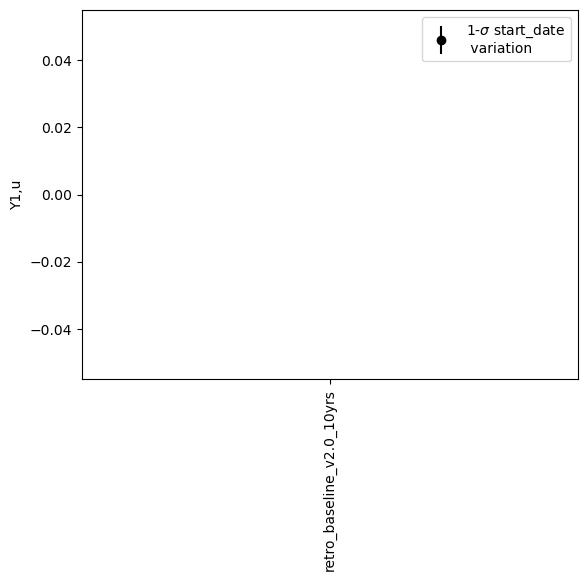

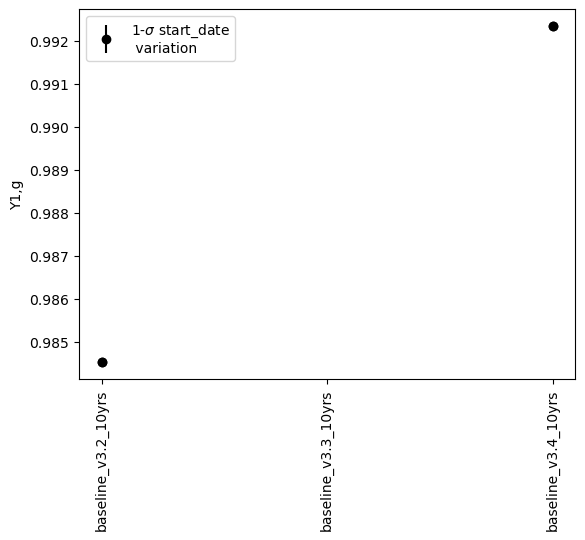

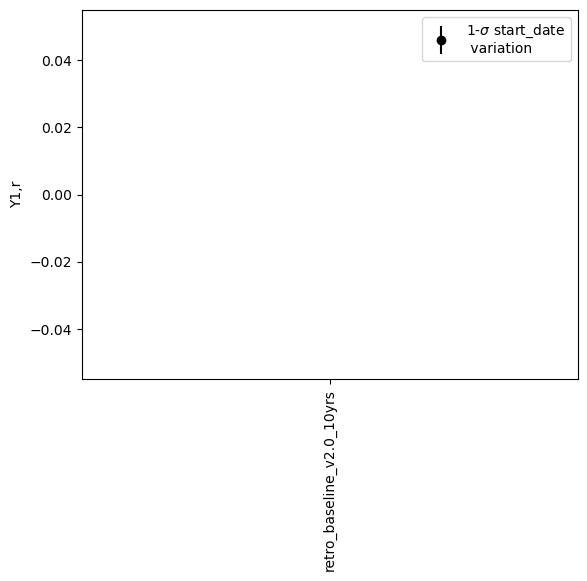

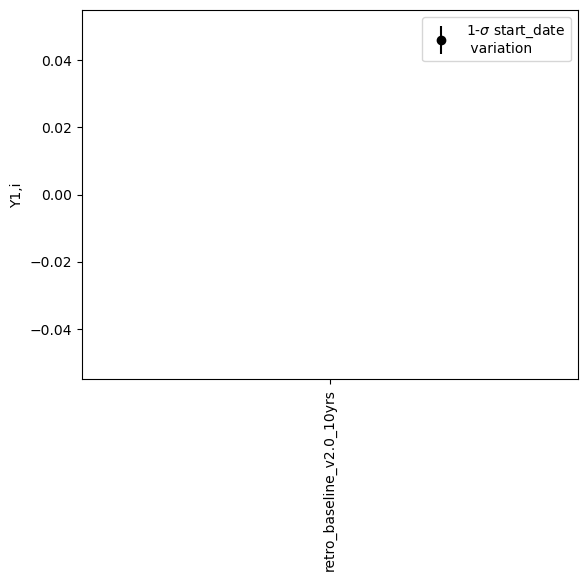

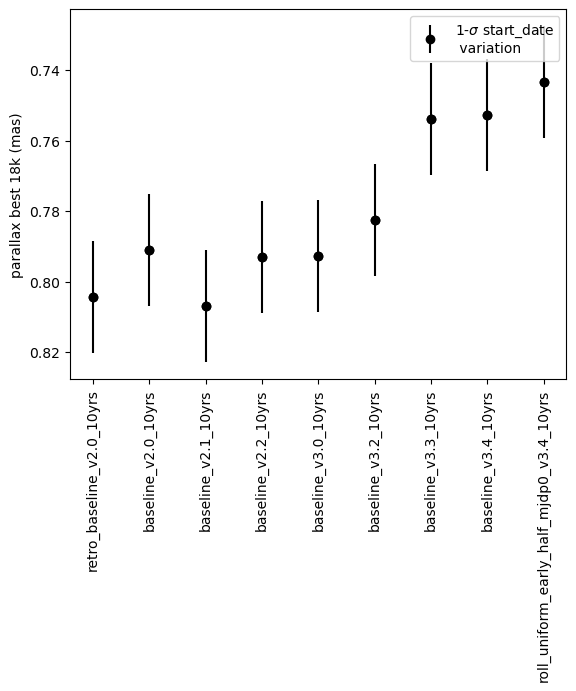

...

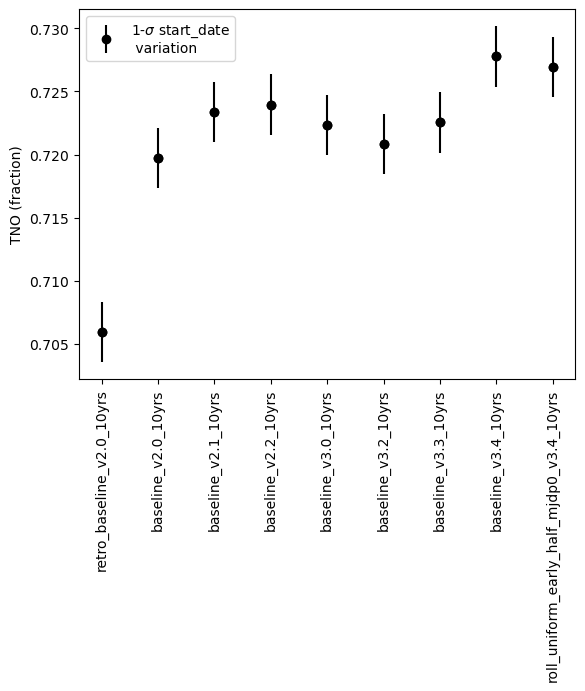

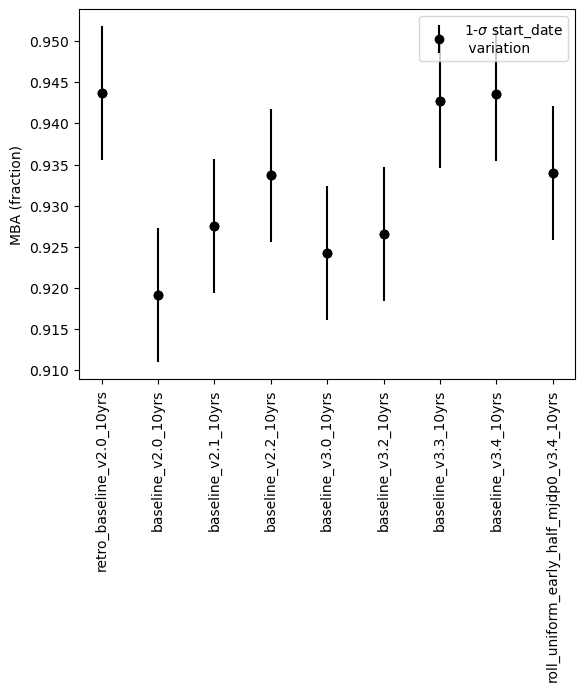

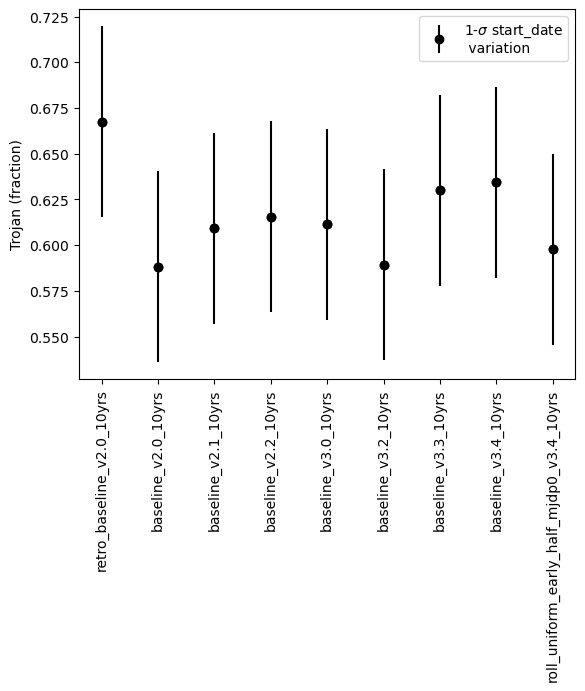

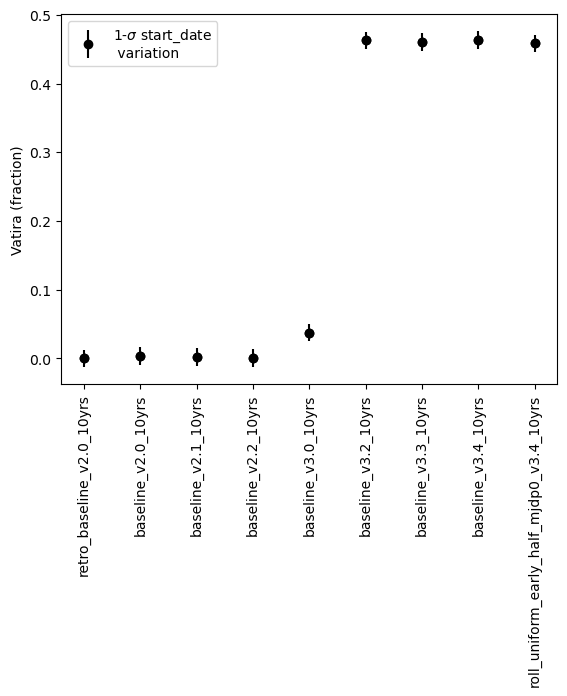

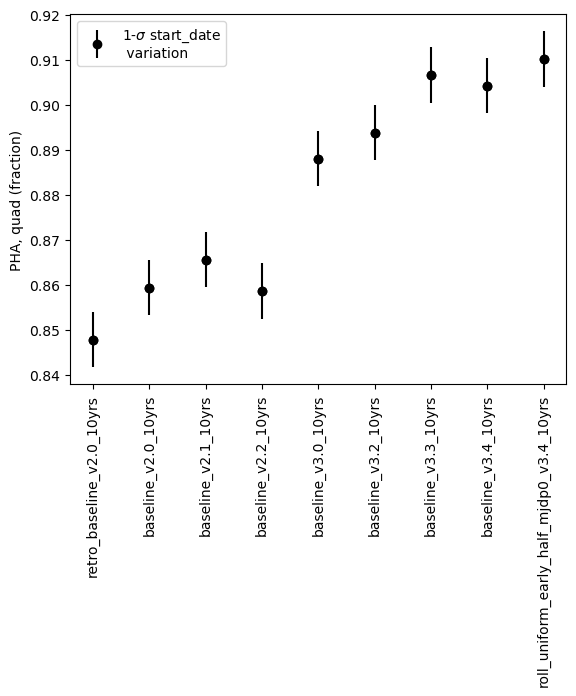

In [30]:
# Rough error bars from start date simulations
std_dict = {}
weather_runs = [run for run in data.index if 'start_date' in run]
for col in data.columns:
    std_dict[col] = np.ptp(data.loc[weather_runs][col])

std_mag_dict = {}
for col in mag_data.columns:
    std_mag_dict[col] = np.ptp(mag_data.loc[weather_runs][col])
    
std_ddf_dict = {}
for col in ddf_data.columns:
    std_ddf_dict[col] = np.ptp(ddf_data.loc[weather_runs][col])
 

std_gaps_dict = {}
for col in gaps_data.columns:
    std_gaps_dict[col] = np.ptp(gaps_data.loc[weather_runs][col])


#col = data.columns[0]
for col in sub_data.columns:
    fig, ax = plt.subplots()
    ax.plot(sub_data[col], 'ko')
    label_add = ''
    h0 = ax.errorbar(np.arange(sub_data[col].values.size), sub_data[col], yerr=std_dict[col], fmt='s', color='k',
               label=r'1-$\sigma$ start_date'
                '\n variation', marker='o')
    if units[col] != '':
        label_add = ' (' + units[col]+')'
    ax.set_ylabel(col + label_add)
    ax.tick_params(axis='x', labelrotation = 90)
    hh=[h0]
    ax.legend(hh, [H.get_label() for H in hh],
        handler_map={type(h0): HandlerErrorbar(xerr_size=1)})
    if col in invert_cols:
        ax.set_ylim(ax.get_ylim()[::-1])


In [31]:
std_dict

{'Y1,u': nan,
 'Y1,g': nan,
 'Y1,r': nan,
 'Y1,i': nan,
 'parallax best 18k': 0.01592164930500617,
 'proper motion best 18k': 0.004140391188188763,
 '20-30d microlensing\ndetection': 0.018000000000000016,
 '60-90d microlensing\ndetection': 0.02090000000000003,
 'fO N vis': 13.0,
 'SNe, N': 10422.26357900002,
 'SNe, zlim': 0.00731499999999996,
 '3x2 i-band': 0.2970486816429556,
 'WL Nvis \ni-band': 7.0,
 'color slope': 15975.0,
 '2day\ncolor slope': 103221.0,
 'XRB\nearly detect': 118.0,
 'Brown Dwarf Vol': 3866.8801886826986,
 'NEO bright': 0.007200000000000095,
 'NEO faint': 0.008850730688573116,
 'TNO': 0.0023907572010004596,
 'MBA': 0.008134665221451565,
 'Trojan': 0.05224655960545854,
 'Vatira': 0.012799999999999978,
 'PHA, quad': 0.006145358950462532}

In [32]:
for key in std_dict:
    print(key, std_dict[key]/data.loc['baseline_v3.4_10yrs'][key]) 

Y1,u nan
Y1,g nan
Y1,r nan
Y1,i nan
parallax best 18k 0.021153644646400065
proper motion best 18k 0.02331081776159111
20-30d microlensing
detection 0.049274568847522626
60-90d microlensing
detection 0.040355280942266904
fO N vis 0.01591187270501836
SNe, N 0.06897664558029191
SNe, zlim 0.021963833987644288
3x2 i-band 0.007108181119995868
WL Nvis 
i-band 0.016166281755196306
color slope 0.06903212424485985
2day
color slope 0.06620839084765419
XRB
early detect 0.05775819872736172
Brown Dwarf Vol 0.020490172975200543
NEO bright 0.007596539354294256
NEO faint 0.013252415748207114
TNO 0.0032849760056867464
MBA 0.008620839766898111
Trojan 0.08233882064429786
Vatira 0.027621924902891625
PHA, quad 0.006796268417220172


/var/folders/jv/jdhmc2t93njct5cx375mztcr0000gn/T/ipykernel_63699/1292493311.py:5: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "s" (-> marker='s'). The keyword argument will take precedence.
  h0 = ax.errorbar(np.arange(sub_gaps[col].values.size), sub_gaps[col], yerr=std_gaps_dict[col], fmt='s', color='k',


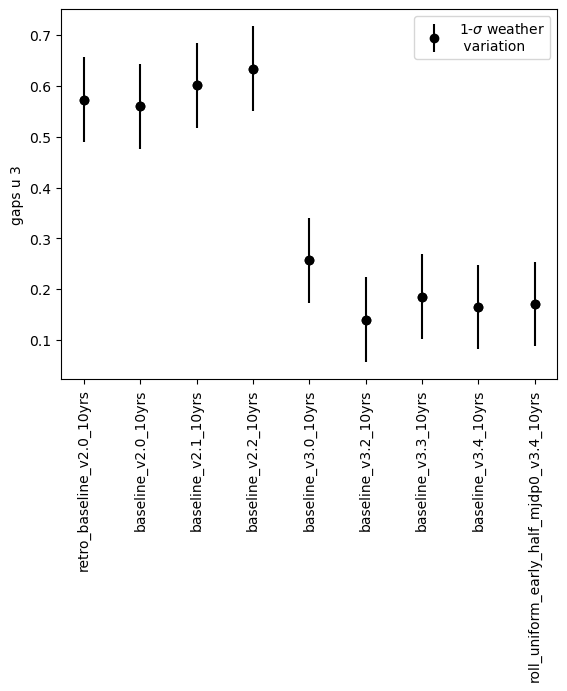

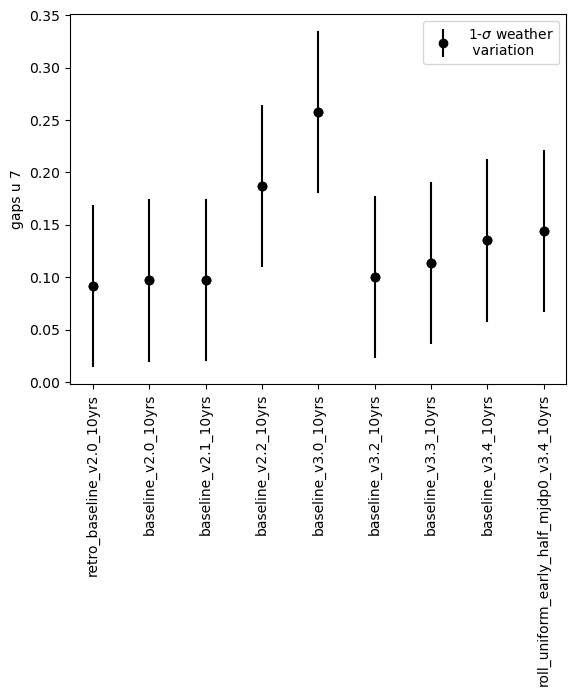

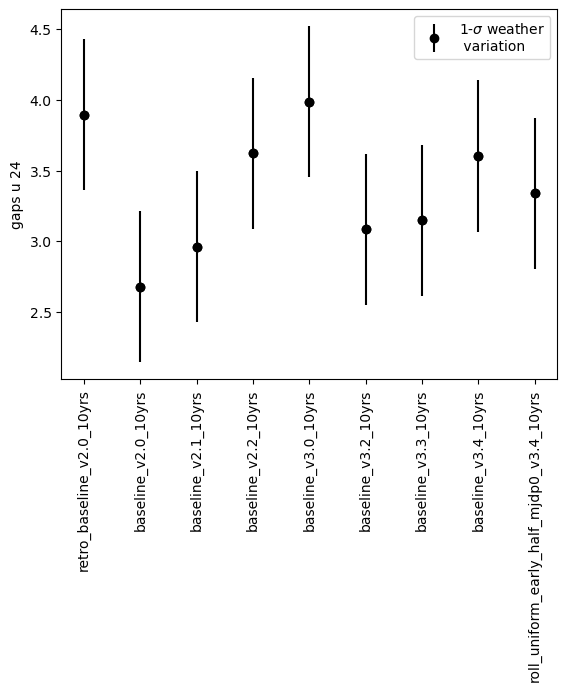

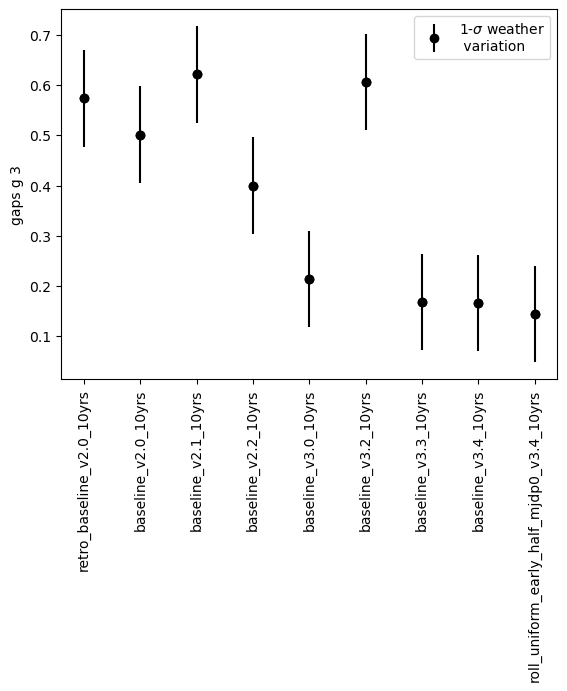

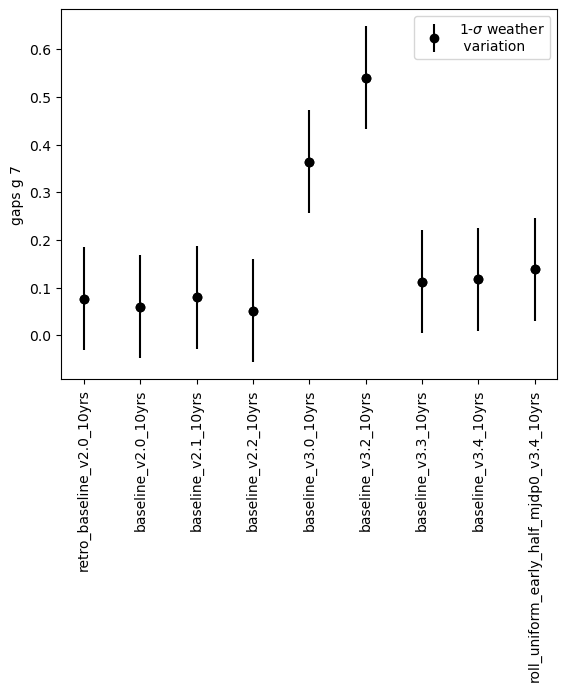

...

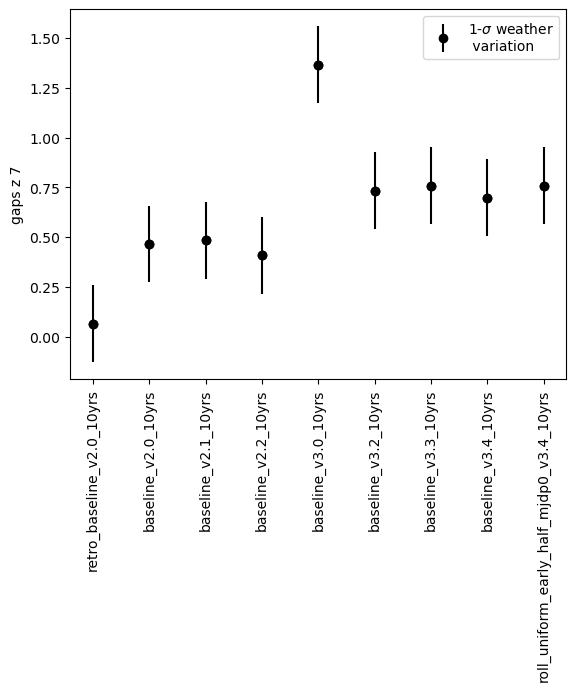

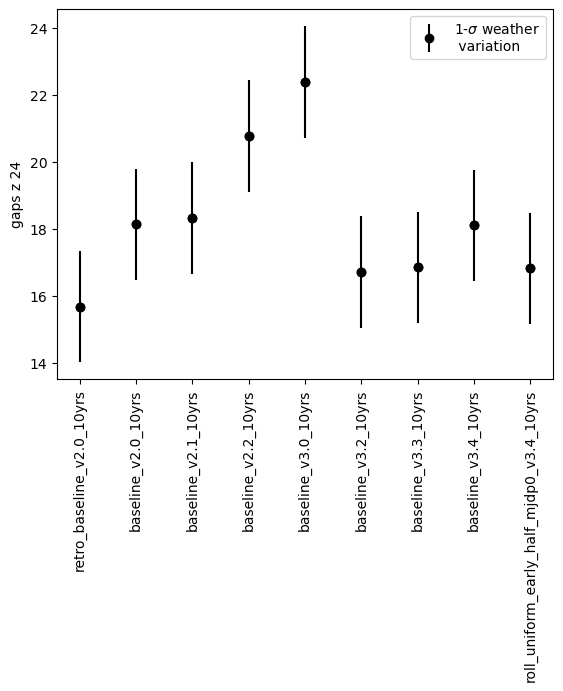

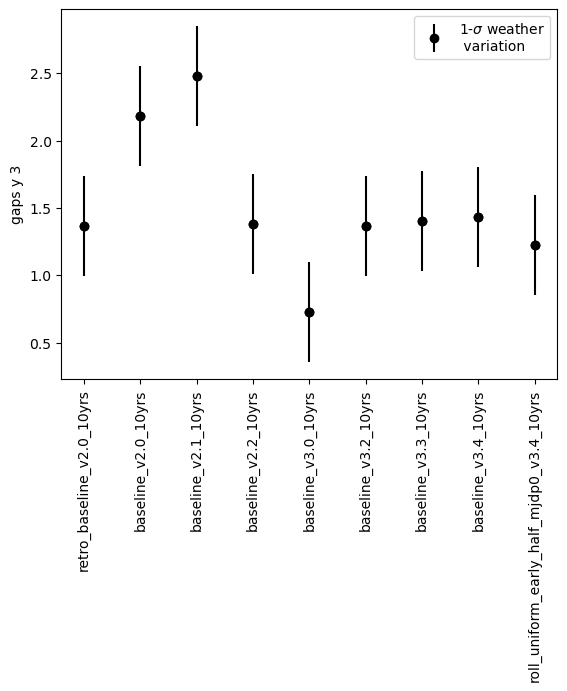

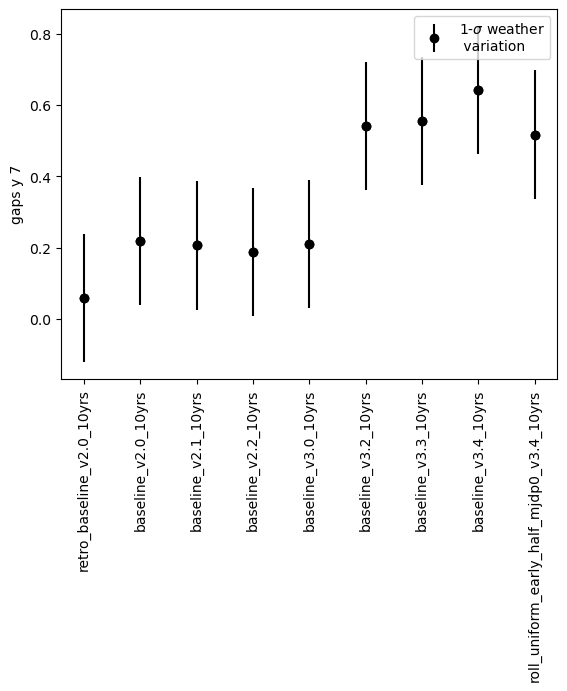

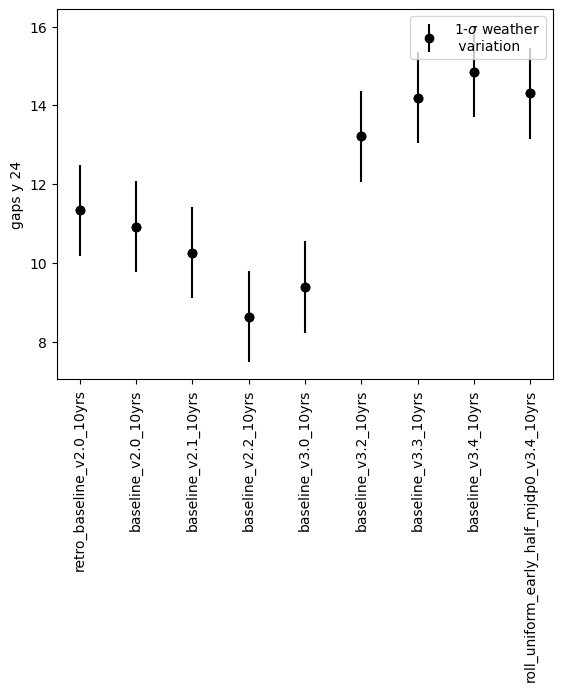

In [33]:
for col in sub_gaps.columns:
    fig, ax = plt.subplots()
    ax.plot(sub_gaps[col], 'ko')
    label_add = ''
    h0 = ax.errorbar(np.arange(sub_gaps[col].values.size), sub_gaps[col], yerr=std_gaps_dict[col], fmt='s', color='k',
               label=r'1-$\sigma$ weather'
                '\n variation', marker='o')
    #if units[col] != '':
    #    label_add = ' (' + units[col]+')'
    ax.set_ylabel(col + label_add)
    ax.tick_params(axis='x', labelrotation = 90)
    hh=[h0]
    ax.legend(hh, [H.get_label() for H in hh],
        handler_map={type(h0): HandlerErrorbar(xerr_size=1)})
    if col in invert_cols:
        ax.set_ylim(ax.get_ylim()[::-1])


/var/folders/jv/jdhmc2t93njct5cx375mztcr0000gn/T/ipykernel_63699/3981456560.py:23: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "s" (-> marker='s'). The keyword argument will take precedence.
  h0 = ax.errorbar(np.arange(sub_gaps[col].values.size), sub_gaps[col], yerr=std_ddf_dict[col], fmt='s', color='k',


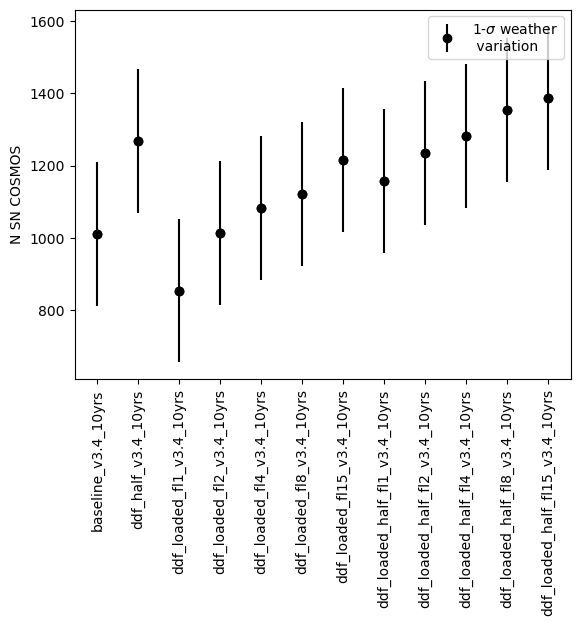

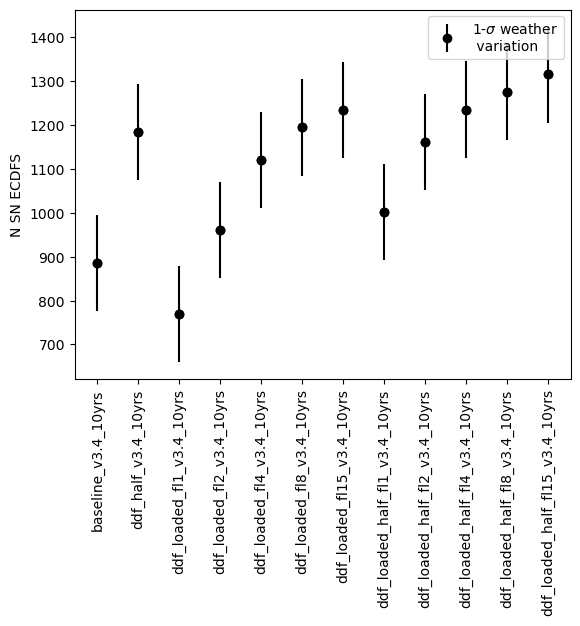

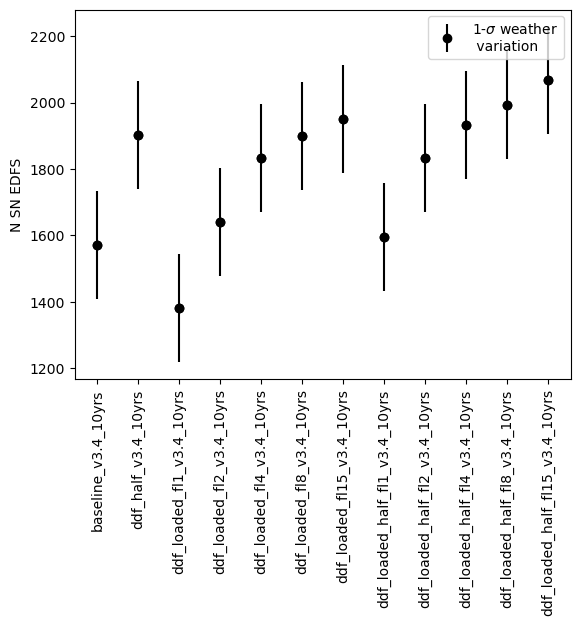

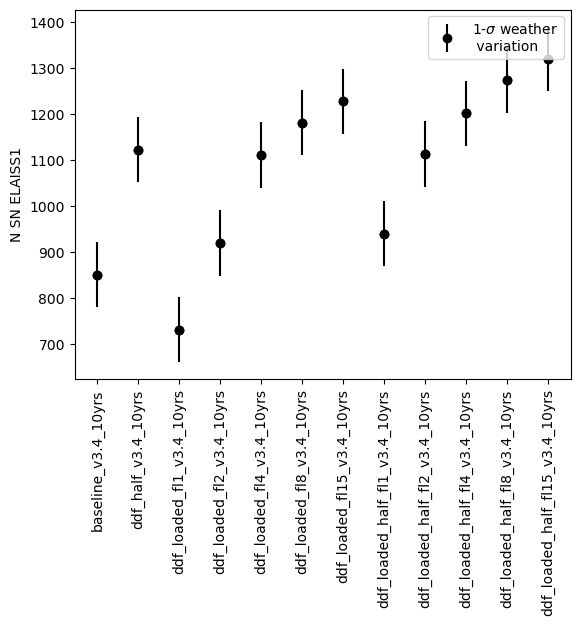

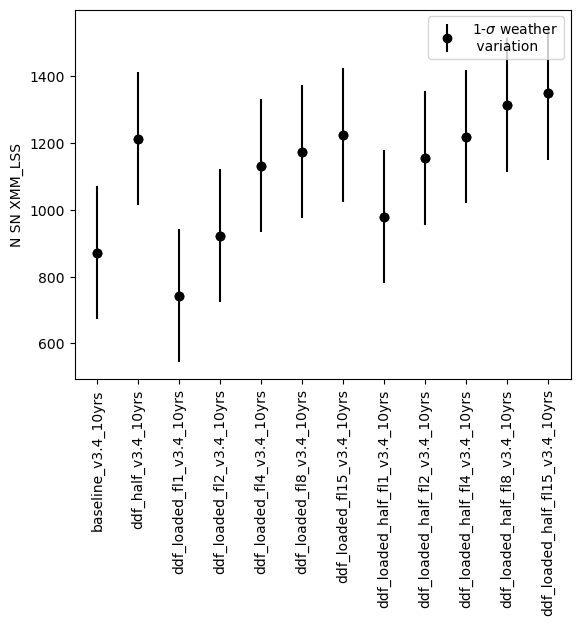

...

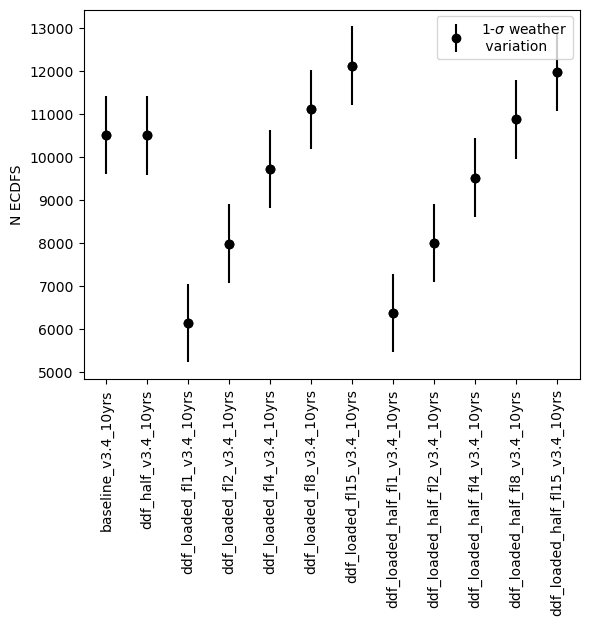

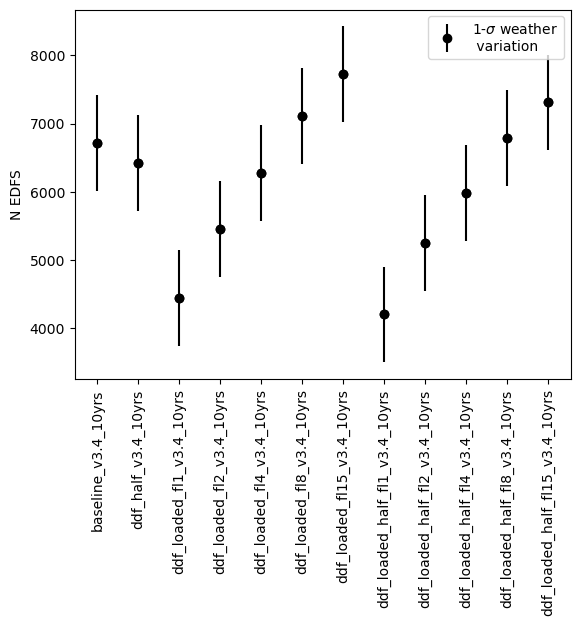

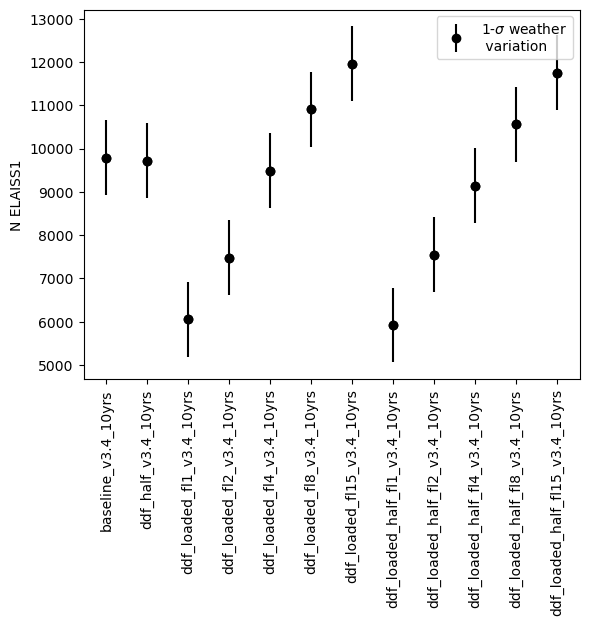

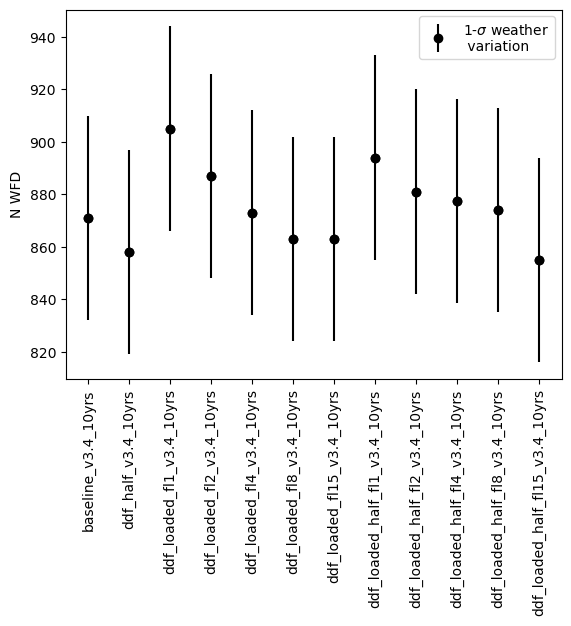

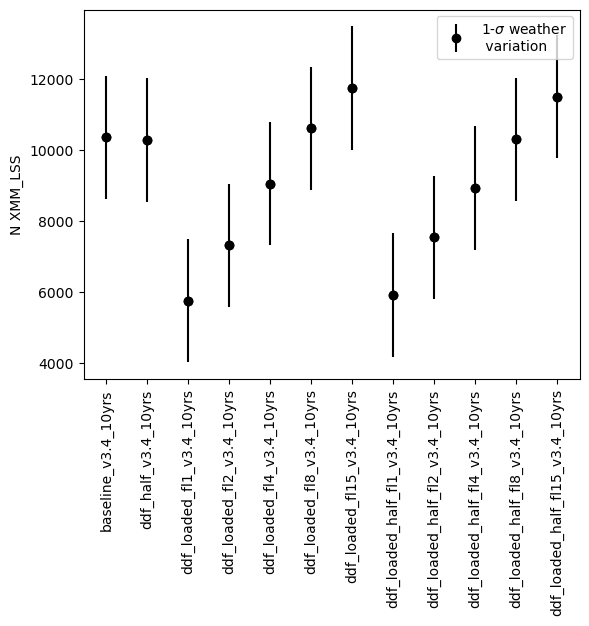

In [34]:
#times = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'ddf' in run and 'short' not in run]
times = ['baseline_v3.4_10yrs',
 'ddf_half_v3.4_10yrs',
 
 'ddf_loaded_fl1_v3.4_10yrs',
 'ddf_loaded_fl2_v3.4_10yrs',
 'ddf_loaded_fl4_v3.4_10yrs',
 'ddf_loaded_fl8_v3.4_10yrs',
 'ddf_loaded_fl15_v3.4_10yrs',
 'ddf_loaded_half_fl1_v3.4_10yrs',
 'ddf_loaded_half_fl2_v3.4_10yrs',
 'ddf_loaded_half_fl4_v3.4_10yrs',
 'ddf_loaded_half_fl8_v3.4_10yrs',
        'ddf_loaded_half_fl15_v3.4_10yrs',]
sub_gaps = ddf_data.reindex(labels=times)



for col in sub_gaps.columns:
    fig, ax = plt.subplots()
    ax.plot(sub_gaps[col], 'ko')
    label_add = ''
    h0 = ax.errorbar(np.arange(sub_gaps[col].values.size), sub_gaps[col], yerr=std_ddf_dict[col], fmt='s', color='k',
               label=r'1-$\sigma$ weather'
                '\n variation', marker='o')
    #if units[col] != '':
    #    label_add = ' (' + units[col]+')'
    ax.set_ylabel(col + label_add)
    ax.tick_params(axis='x', labelrotation = 90)
    hh=[h0]
    ax.legend(hh, [H.get_label() for H in hh],
        handler_map={type(h0): HandlerErrorbar(xerr_size=1)})
    if col in invert_cols:
        ax.set_ylim(ax.get_ylim()[::-1])

In [35]:
[run for run in data.index if 'noroll' in run]

['noroll_mjdp0_v3.4_10yrs',
 'noroll_mjdp120_v3.4_10yrs',
 'noroll_mjdp180_v3.4_10yrs',
 'noroll_mjdp270_v3.4_10yrs',
 'noroll_mjdp365_v3.4_10yrs',
 'noroll_mjdp60_v3.4_10yrs',
 'noroll_v3.4_10yrs']

In [36]:
times = ['baseline_v3.3_10yrs', 'baseline_v3.4_10yrs', 'noroll_mjdp0_v3.4_10yrs', 'roll_uniform_early_half_mjdp0_v3.4_10yrs']

sub_data = data.reindex(labels=times)
sub_ddf = ddf_data.reindex(labels=times)
sub_mag = mag_data.reindex(labels=times)
sub_gaps = gaps_data.reindex(labels=times)


/var/folders/jv/jdhmc2t93njct5cx375mztcr0000gn/T/ipykernel_63699/1292493311.py:5: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "s" (-> marker='s'). The keyword argument will take precedence.
  h0 = ax.errorbar(np.arange(sub_gaps[col].values.size), sub_gaps[col], yerr=std_gaps_dict[col], fmt='s', color='k',


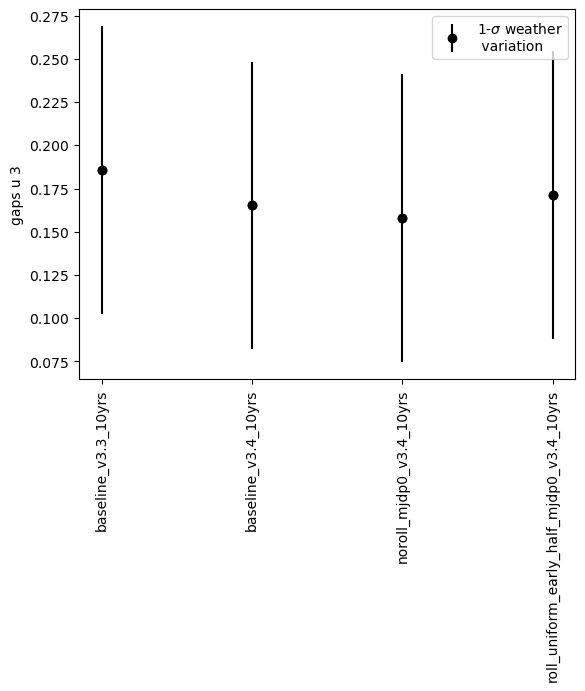

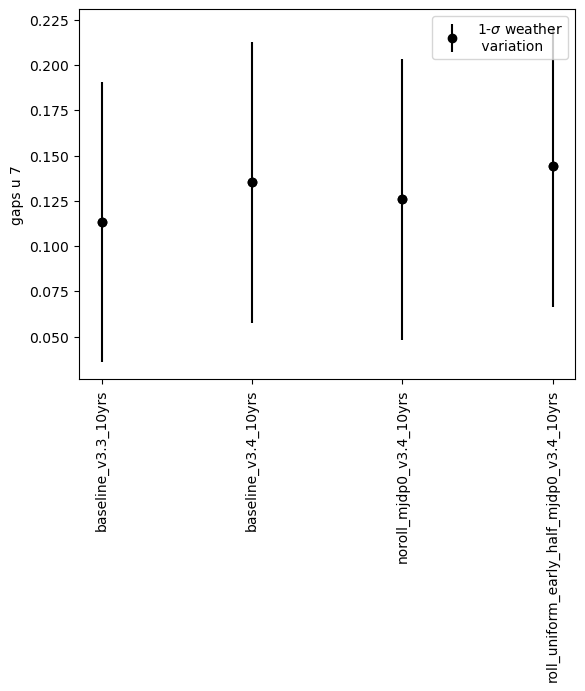

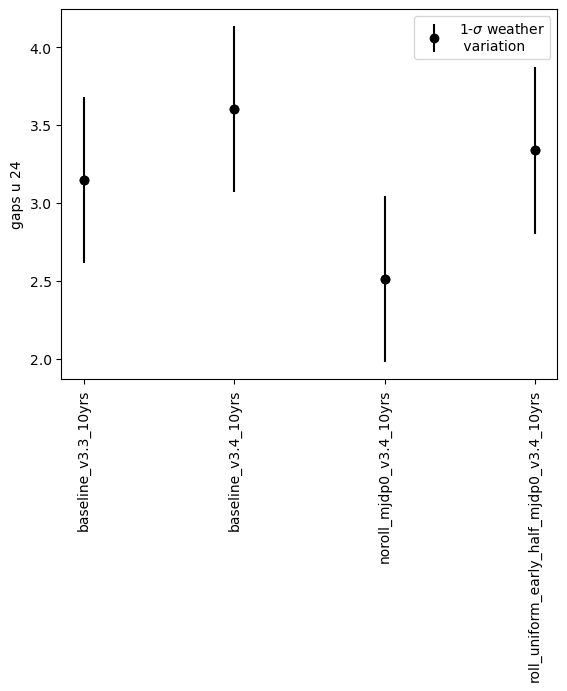

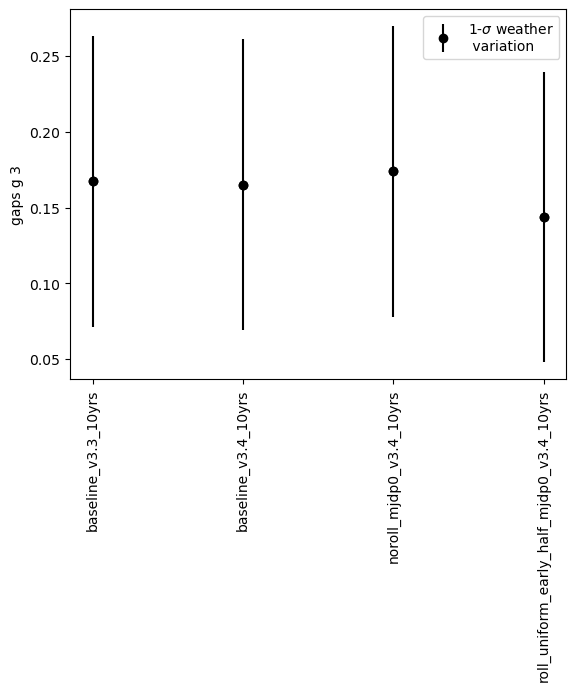

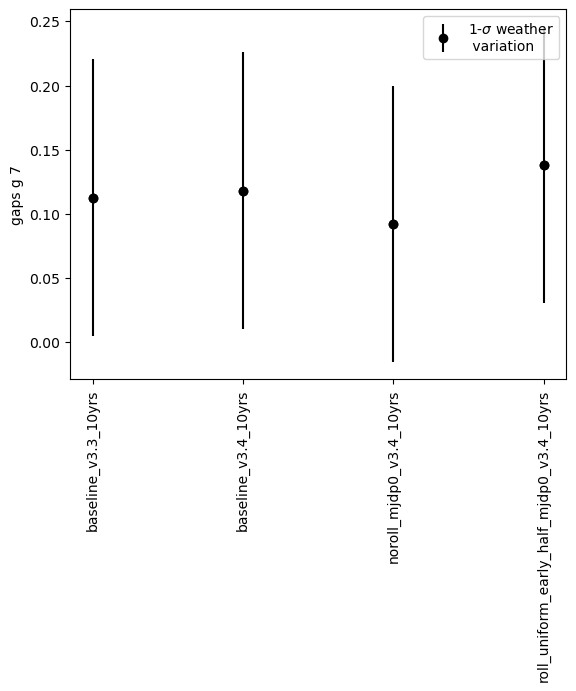

...

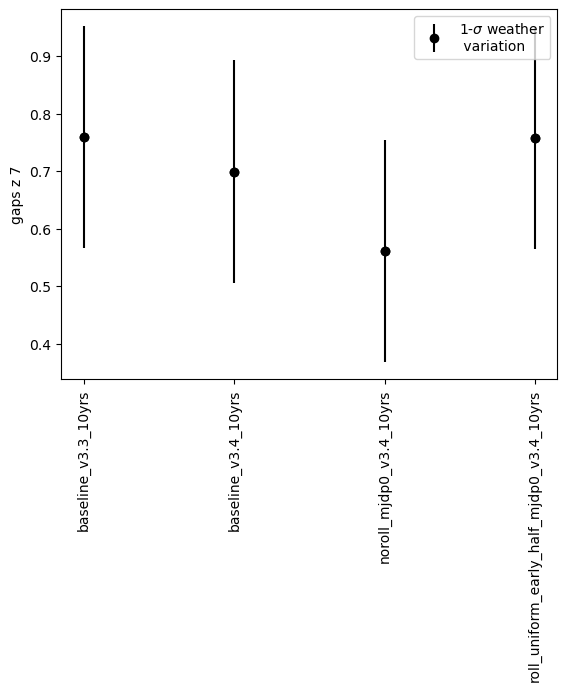

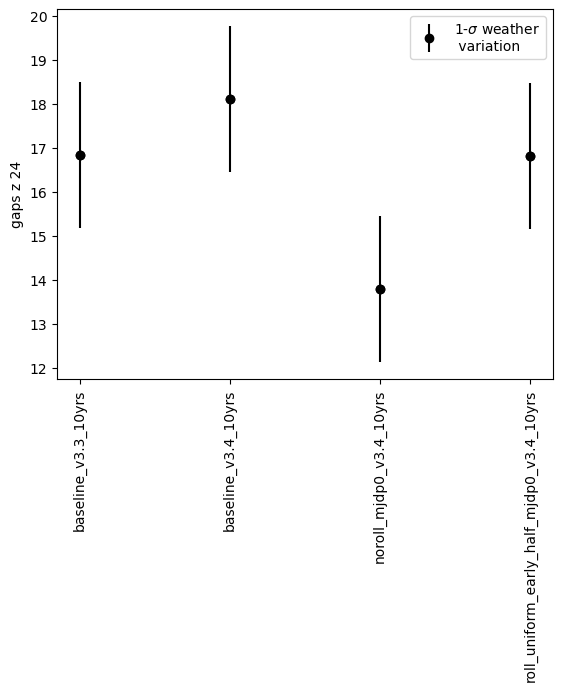

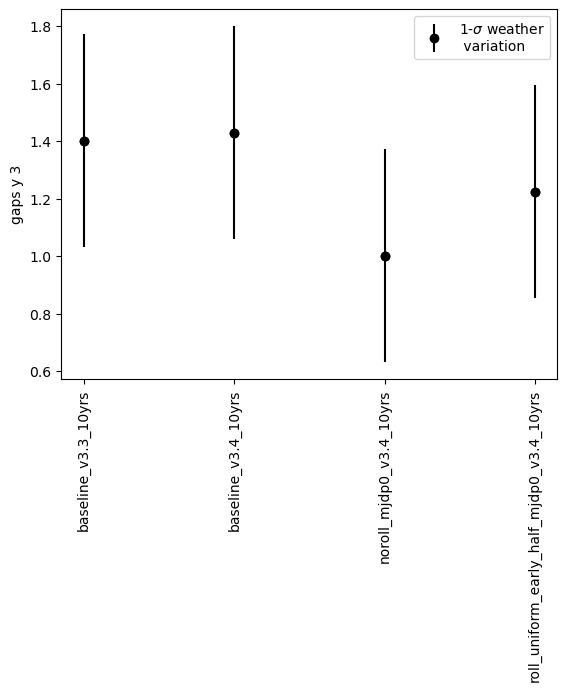

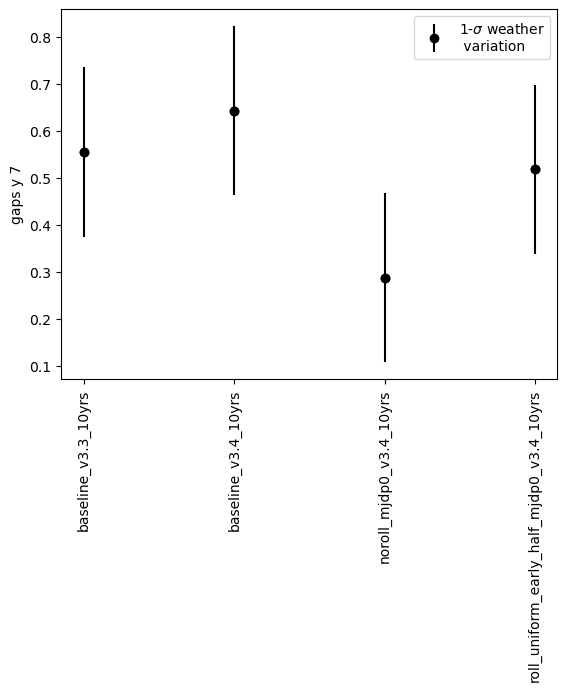

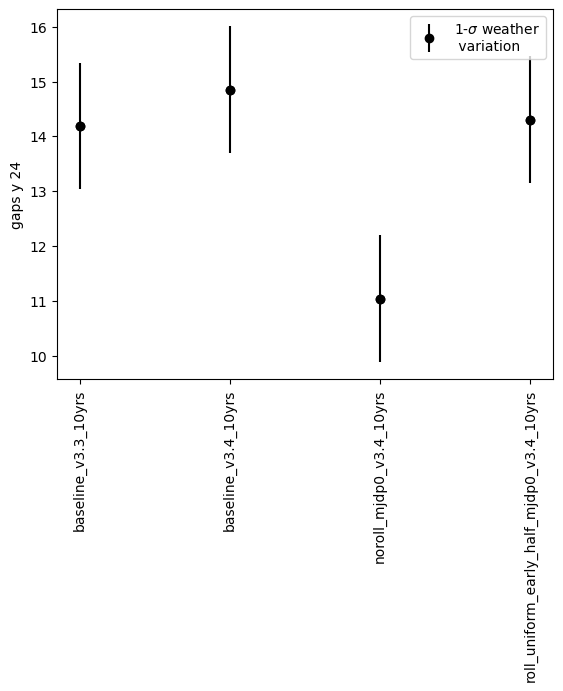

In [37]:
for col in sub_gaps.columns:
    fig, ax = plt.subplots()
    ax.plot(sub_gaps[col], 'ko')
    label_add = ''
    h0 = ax.errorbar(np.arange(sub_gaps[col].values.size), sub_gaps[col], yerr=std_gaps_dict[col], fmt='s', color='k',
               label=r'1-$\sigma$ weather'
                '\n variation', marker='o')
    #if units[col] != '':
    #    label_add = ' (' + units[col]+')'
    ax.set_ylabel(col + label_add)
    ax.tick_params(axis='x', labelrotation = 90)
    hh=[h0]
    ax.legend(hh, [H.get_label() for H in hh],
        handler_map={type(h0): HandlerErrorbar(xerr_size=1)})
    if col in invert_cols:
        ax.set_ylim(ax.get_ylim()[::-1])


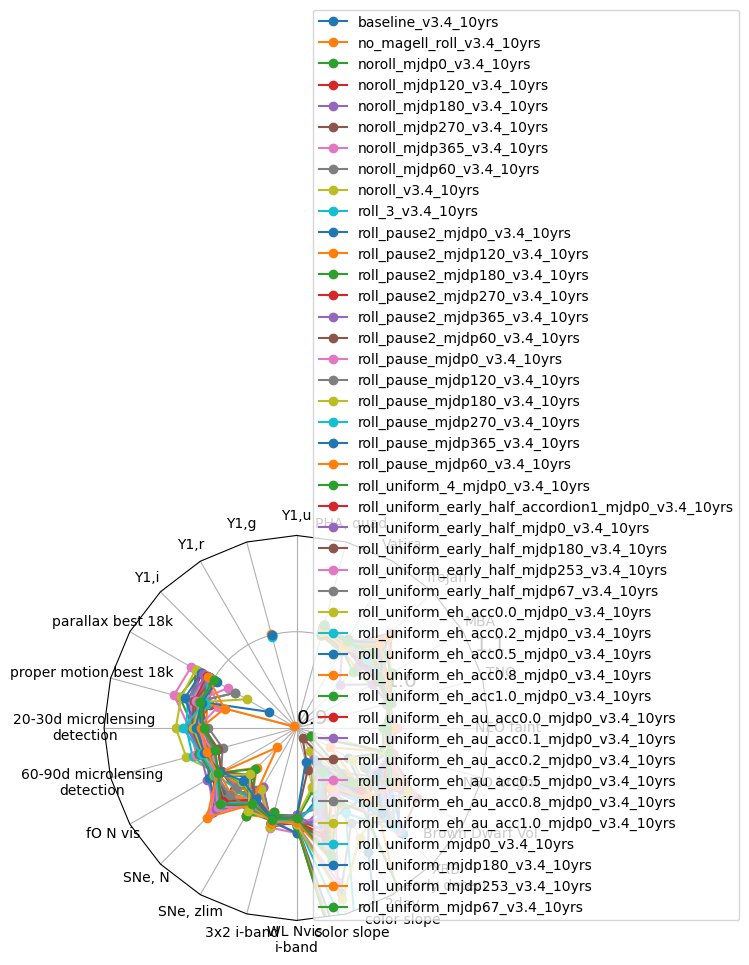

In [38]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'roll' in run]


ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

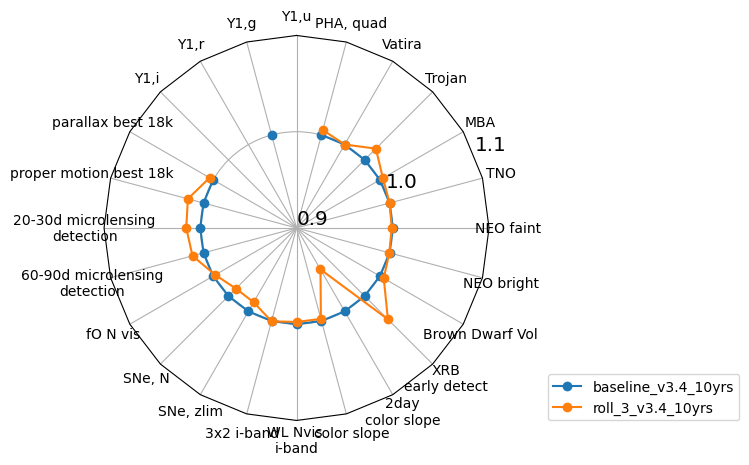

In [39]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'roll_3' in run]


ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

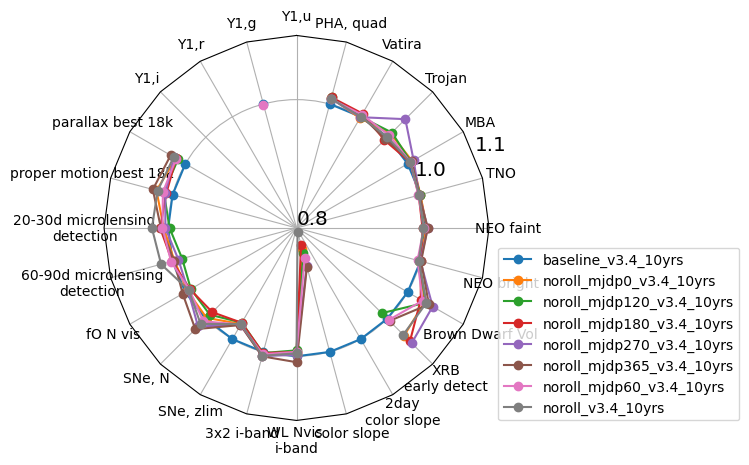

In [40]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'noroll' in run]


ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.8, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

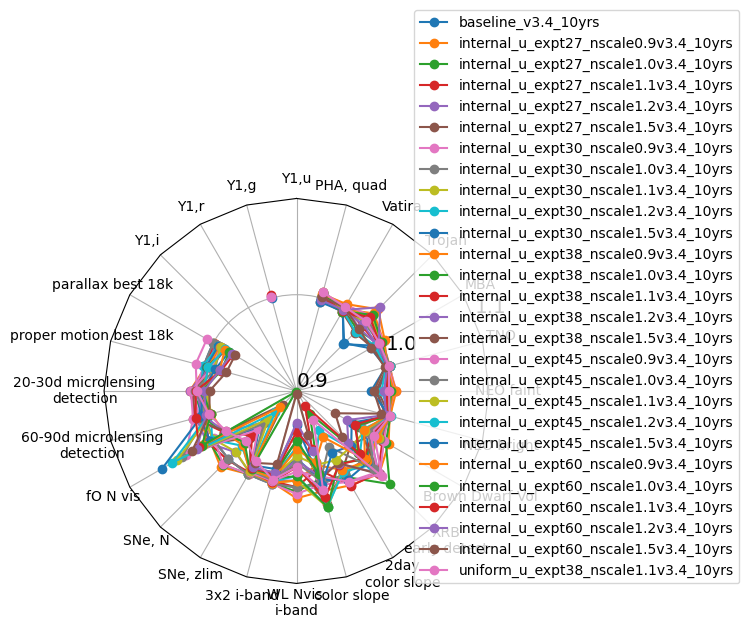

In [41]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'u_exp' in run]


ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

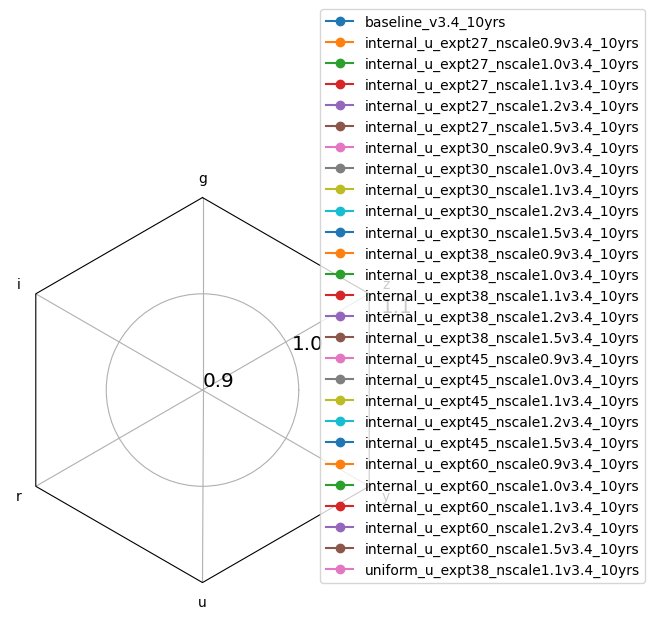

In [42]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'u_exp' in run]

ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.90, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

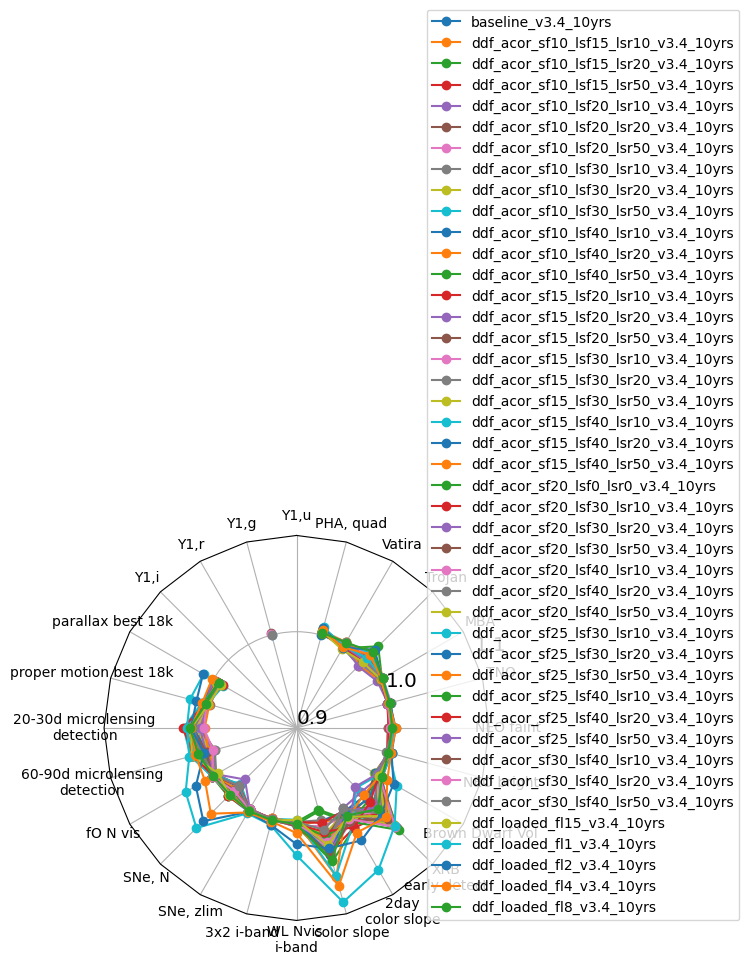

In [43]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'ddf' in run and 'half' not in run]


ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

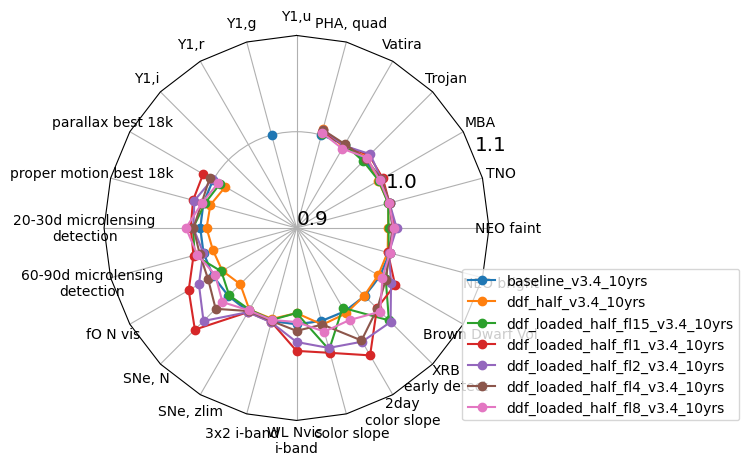

In [44]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'ddf' in run and 'half' in run]


ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

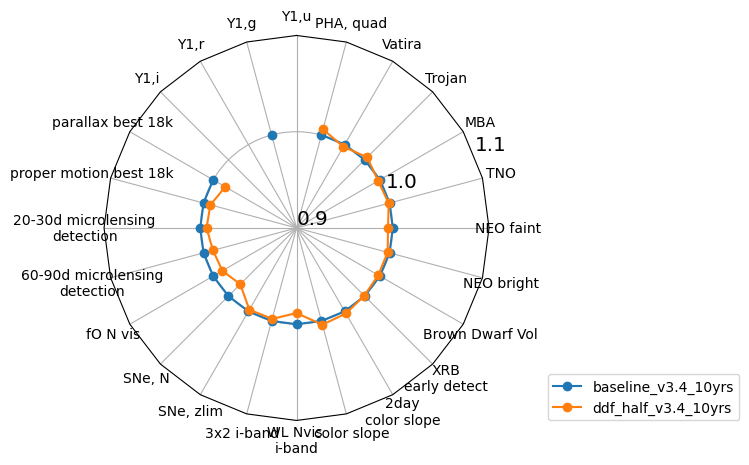

In [45]:
runs = ['baseline_v3.4_10yrs', 'ddf_half_v3.4_10yrs'] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

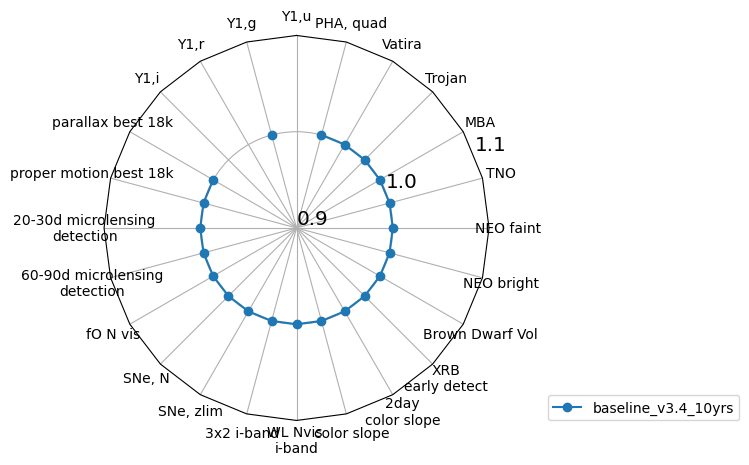

In [46]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'extra_n' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

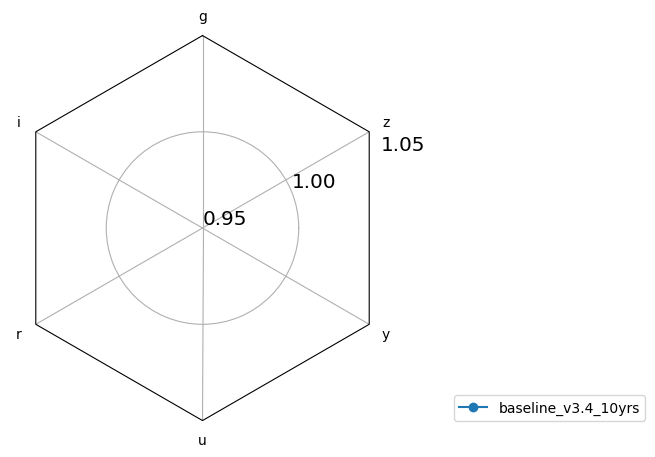

In [47]:
#runs = ['baseline_v3.4_10yrs'] + ['too_100_4v3.4_10yrs'] 

ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')#, invert_cols=['u', 'g', 'r', 'i', 'z', 'y'])
fig, ax = radar(ndata, legend=True, rgrids=[0.95, 1.0, 1.05], bbox_to_anchor=(1.65, 0))

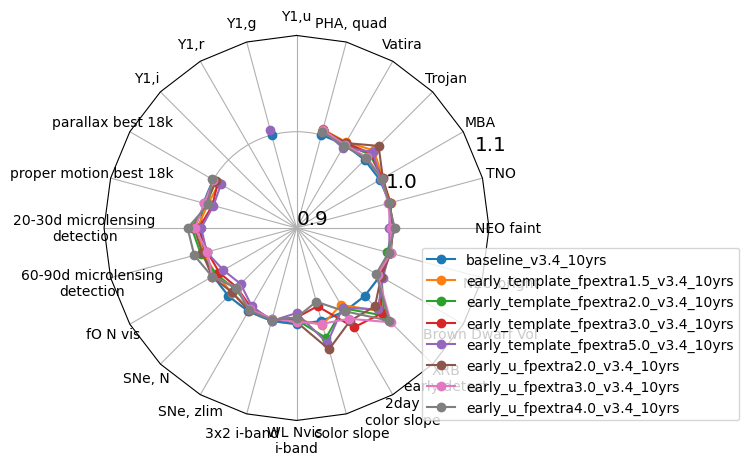

In [48]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'early_' in run and 'roll' not in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

In [49]:
ndata

,"Y1,u","Y1,g","Y1,r","Y1,i",parallax best 18k,proper motion best 18k,20-30d microlensing\ndetection,60-90d microlensing\ndetection,fO N vis,"SNe, N",...,2day\ncolor slope,XRB\nearly detect,Brown Dwarf Vol,NEO bright,NEO faint,TNO,MBA,Trojan,Vatira,"PHA, quad"
baseline_v3.4_10yrs,NaN,1.000000,NaN,NaN,1.000000,1.000000,1.0000,1.0000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.0000,1.000000,1.000000,1.000000,1.000000,1.0000,1.000000
early_template_fpextra1.5_v3.4_10yrs,NaN,NaN,NaN,NaN,0.993039,0.995195,1.0033,1.0005,0.996328,0.995225,...,0.992245,1.022026,1.000821,1.0002,0.998029,1.001264,1.003334,1.013868,1.0031,1.005992
early_template_fpextra2.0_v3.4_10yrs,NaN,NaN,NaN,NaN,0.996979,0.996872,1.0090,1.0031,0.996328,0.989882,...,0.996277,1.028879,1.001835,0.9978,0.999931,1.000326,1.002522,1.007971,1.0003,1.005033
early_template_fpextra3.0_v3.4_10yrs,NaN,NaN,NaN,NaN,0.994348,0.990535,1.0013,0.9960,0.992656,0.987573,...,1.019232,1.025453,0.999471,1.0008,0.998442,1.000840,1.002750,1.009339,1.0022,1.005098
early_template_fpextra5.0_v3.4_10yrs,NaN,1.005198,NaN,NaN,0.990677,0.989390,0.9990,0.9967,0.987760,0.982183,...,0.995809,1.019579,1.003607,1.0000,0.996409,1.000566,1.000815,1.012014,0.9961,1.005318
early_u_fpextra2.0_v3.4_10yrs,NaN,NaN,NaN,NaN,0.996633,0.998248,1.0064,1.0012,1.001224,0.994750,...,1.011351,1.015174,1.001514,1.0014,1.000346,0.999746,1.003600,1.020524,1.0019,1.005252
early_u_fpextra3.0_v3.4_10yrs,NaN,NaN,NaN,NaN,0.999621,0.999144,1.0056,0.9961,1.001224,0.987547,...,1.008901,1.038669,0.997292,1.0014,0.997972,0.998657,1.002102,1.003672,0.9999,1.005513
early_u_fpextra4.0_v3.4_10yrs,NaN,NaN,NaN,NaN,1.001675,0.994919,1.0132,1.0100,1.001224,0.988212,...,0.999904,1.036221,0.995548,0.9990,1.001882,0.999512,1.002404,1.002145,0.9984,1.003222


In [50]:
data['XRB\nearly detect']['start_date_do-180v3.4_10yrs'], data['XRB\nearly detect']['baseline_v3.4_10yrs']

(2023.0, 2043.0)

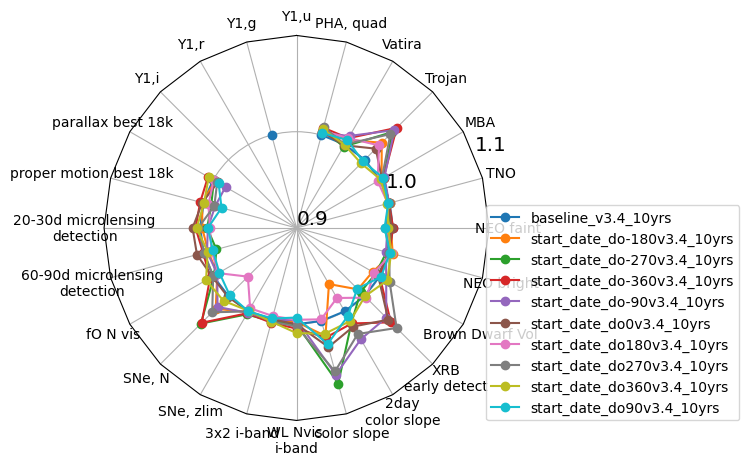

In [51]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'start' in run ] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

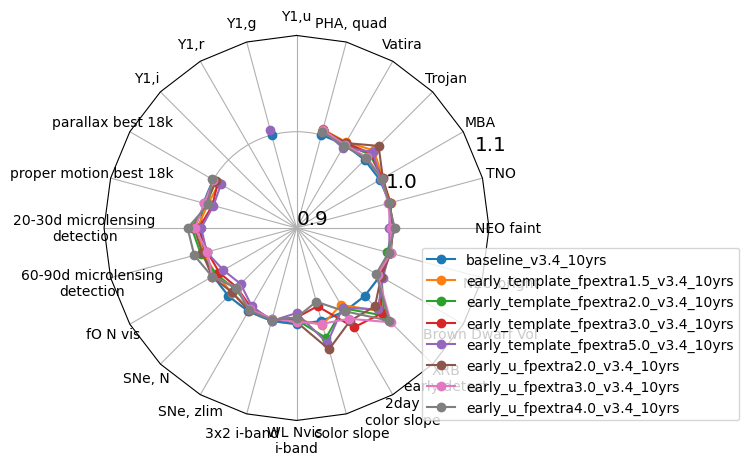

In [52]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'early_' in run and 'half' not in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

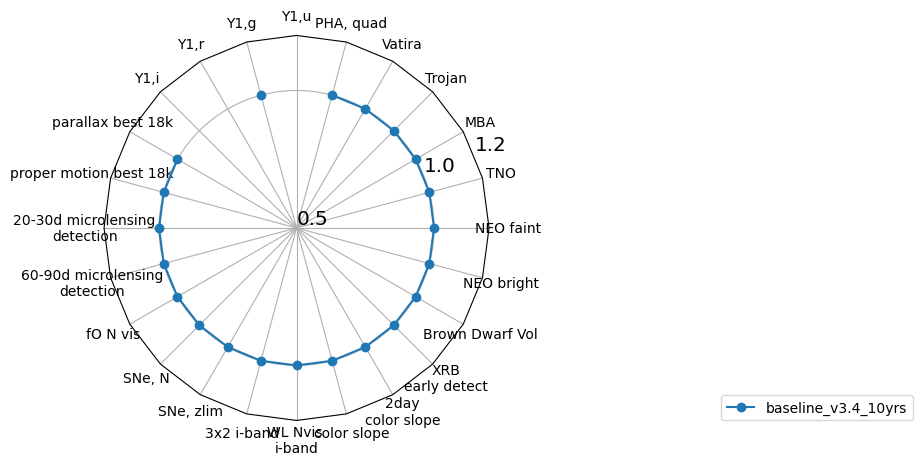

In [53]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'no_pair' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.5, 1.0, 1.2], bbox_to_anchor=(2.1, 0))

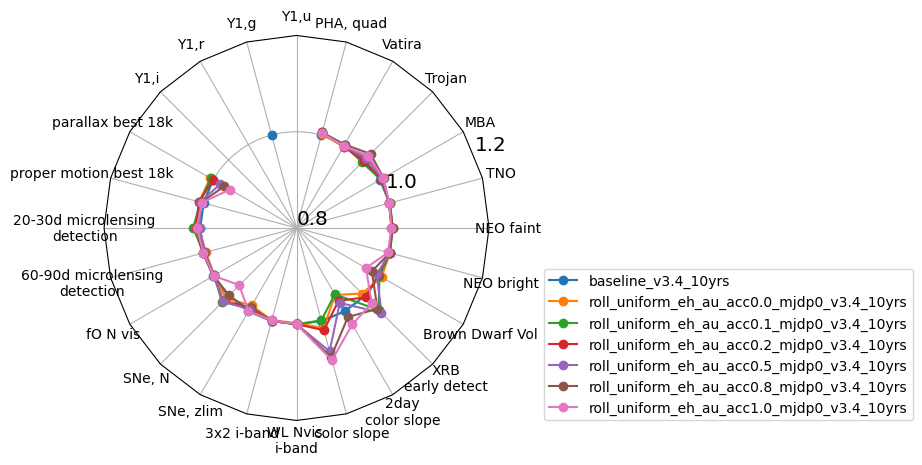

In [54]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'eh_au_acc' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.8, 1.0, 1.2], bbox_to_anchor=(2.1, 0))

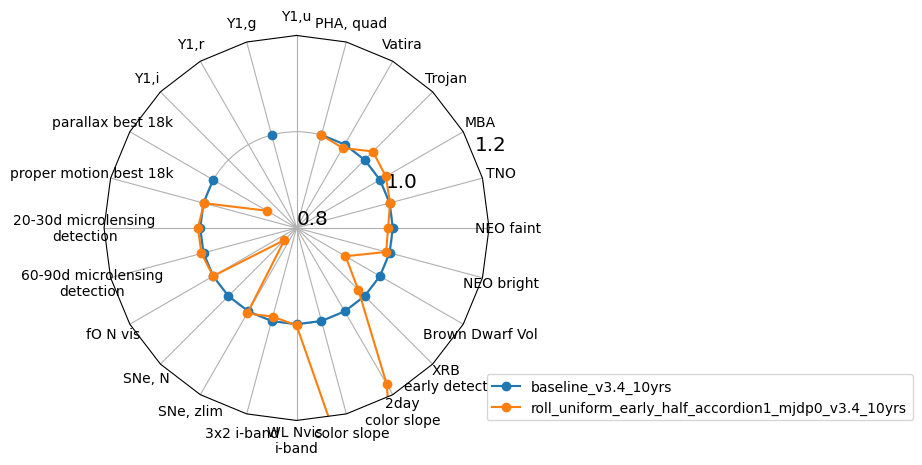

In [55]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'acco' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.8, 1.0, 1.2], bbox_to_anchor=(2.1, 0))

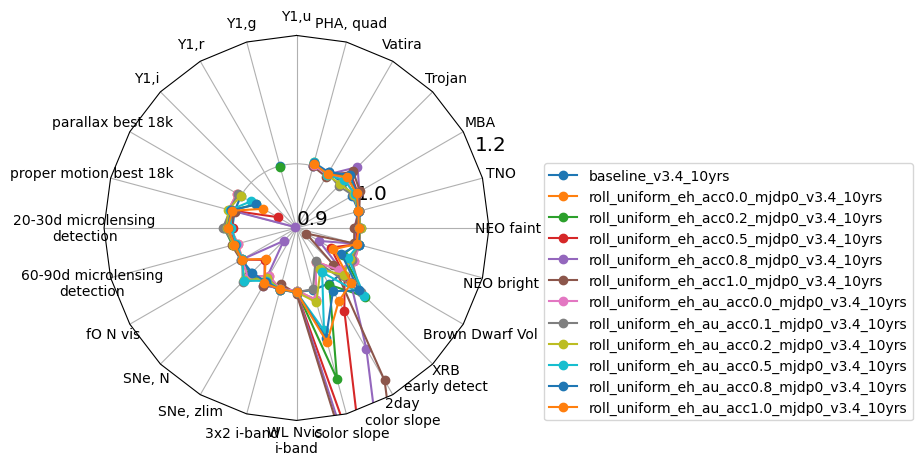

In [56]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'roll_uniform_eh' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.2], bbox_to_anchor=(2.1, 0))

In [57]:
np.where(data_loaded.index == 'roll_uniform_eh_acc0.0_mjdp0_v3.4_10yrs')
data.iloc[126]

Y1,u                                       NaN
Y1,g                                       NaN
Y1,r                              9.989683e-01
Y1,i                                       NaN
parallax best 18k                 7.486930e-01
proper motion best 18k            1.775246e-01
20-30d microlensing\ndetection    3.611000e-01
60-90d microlensing\ndetection    5.024000e-01
fO N vis                          8.090000e+02
SNe, N                            1.464301e+05
SNe, zlim                         3.166315e-01
3x2 i-band                        4.166143e+01
WL Nvis \ni-band                  4.300000e+02
color slope                       2.187100e+05
2day\ncolor slope                 1.422803e+06
XRB\nearly detect                 2.055000e+03
Brown Dwarf Vol                   1.876230e+05
NEO bright                        9.516000e-01
NEO faint                         6.622476e-01
TNO                               7.278268e-01
MBA                               9.406216e-01
Trojan       

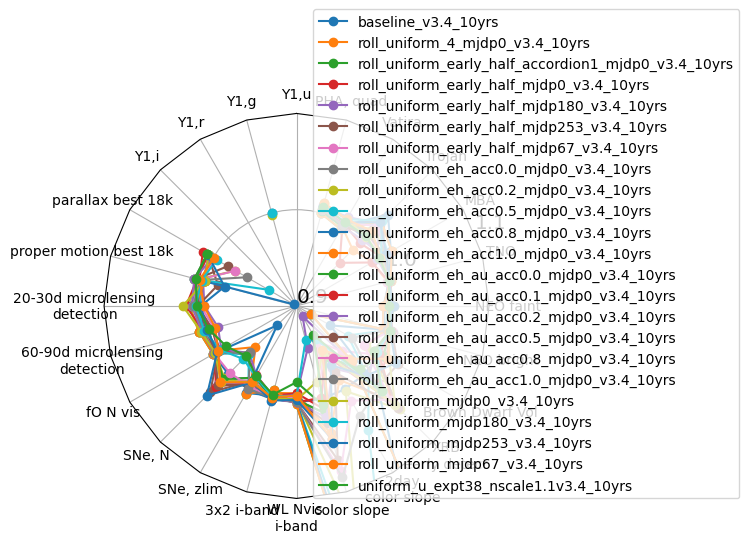

In [58]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'uniform' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

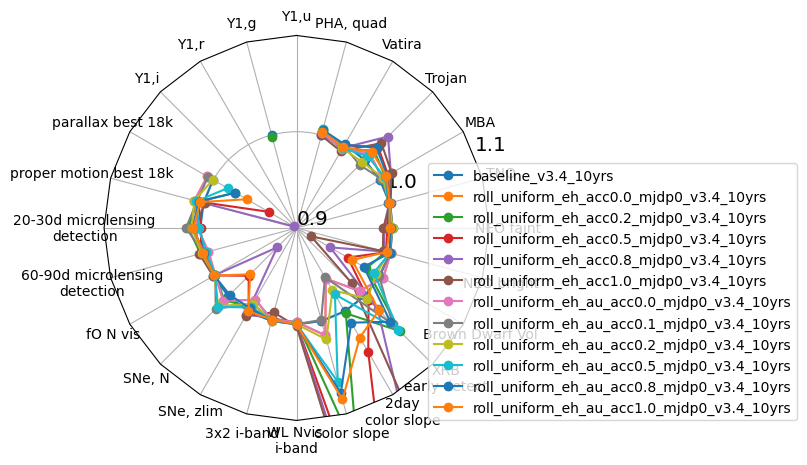

In [59]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'uniform' in run and 'eh'  in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.8, 0))

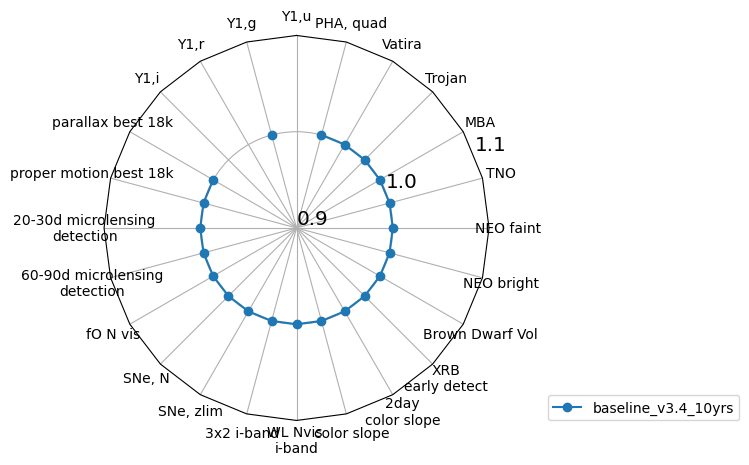

In [60]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'extra_neo3' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

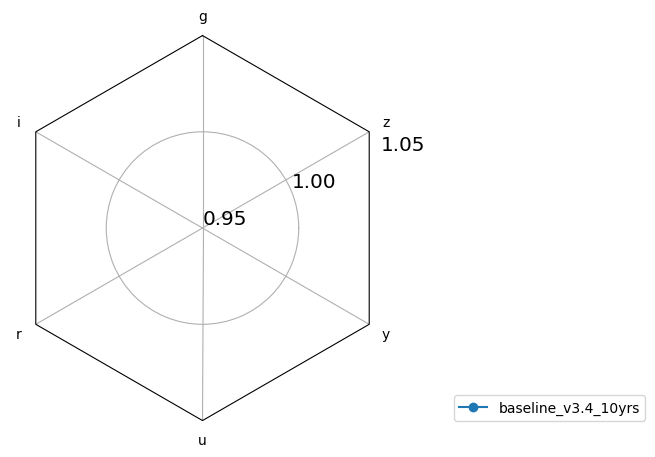

In [61]:
ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')#, invert_cols=['u', 'g', 'r', 'i', 'z', 'y'])
fig, ax = radar(ndata, legend=True, rgrids=[0.95, 1.0, 1.05], bbox_to_anchor=(1.65, 0))

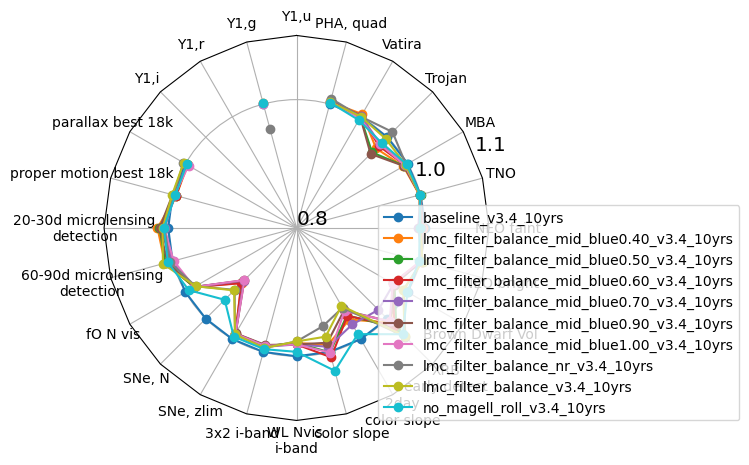

In [62]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'lmc' in run] +  [run for run in data.index if 'magel' in run]

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.8, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

In [63]:
ndata

,"Y1,u","Y1,g","Y1,r","Y1,i",parallax best 18k,proper motion best 18k,20-30d microlensing\ndetection,60-90d microlensing\ndetection,fO N vis,"SNe, N",...,2day\ncolor slope,XRB\nearly detect,Brown Dwarf Vol,NEO bright,NEO faint,TNO,MBA,Trojan,Vatira,"PHA, quad"
baseline_v3.4_10yrs,NaN,1.000000,NaN,NaN,1.000000,1.000000,1.0000,1.0000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.0000,1.000000,1.000000,1.000000,1.000000,1.0000,1.000000
lmc_filter_balance_mid_blue0.40_v3.4_10yrs,NaN,1.000891,NaN,NaN,0.996108,0.994021,1.0167,1.0123,0.984088,0.920869,...,0.964873,1.008811,0.972821,1.0010,0.996975,0.998465,0.992249,0.975354,1.0048,1.003144
lmc_filter_balance_mid_blue0.50_v3.4_10yrs,NaN,NaN,NaN,NaN,0.997902,0.994687,1.0136,1.0115,0.984088,0.917234,...,0.957316,1.020069,0.976234,1.0002,0.992386,1.000084,0.993624,0.966479,0.9993,1.004947
lmc_filter_balance_mid_blue0.60_v3.4_10yrs,NaN,NaN,NaN,NaN,0.997150,0.994296,1.0115,1.0021,0.984088,0.921707,...,0.958168,1.015663,0.972906,1.0024,0.992769,0.998683,0.995335,0.981036,1.0019,1.004838
lmc_filter_balance_mid_blue0.70_v3.4_10yrs,NaN,NaN,NaN,NaN,0.997777,0.996381,1.0057,1.0011,0.984088,0.916156,...,0.973717,0.980421,0.974626,1.0024,0.989798,0.999522,0.995320,0.984804,1.0012,1.003216
lmc_filter_balance_mid_blue0.90_v3.4_10yrs,NaN,NaN,NaN,NaN,0.995717,1.000029,1.0133,1.0083,0.984088,0.915144,...,0.948238,1.006363,0.976581,1.0000,0.992648,0.998982,0.993166,0.963197,0.9990,1.004619
lmc_filter_balance_mid_blue1.00_v3.4_10yrs,NaN,1.000000,NaN,NaN,0.994348,0.996893,1.0062,0.9982,0.984088,0.914735,...,0.949670,1.005384,0.973133,1.0000,0.996262,0.999030,0.995060,0.984201,0.9975,1.004167
lmc_filter_balance_nr_v3.4_10yrs,NaN,0.959750,NaN,NaN,1.003552,0.998466,1.0058,1.0047,0.981640,0.936417,...,0.943510,1.039648,0.992966,1.0016,0.994612,0.999072,0.997192,1.011488,1.0004,1.008610
lmc_filter_balance_v3.4_10yrs,NaN,NaN,NaN,NaN,1.003202,1.000617,1.0087,1.0156,0.981640,0.937570,...,0.940113,1.038179,0.992050,1.0034,0.992726,0.998539,0.996416,0.996504,1.0004,1.003048
no_magell_roll_v3.4_10yrs,NaN,1.001337,NaN,NaN,0.997904,0.995733,1.0067,1.0076,0.993880,0.958319,...,0.991067,1.034263,0.999517,0.9978,0.991899,0.999394,0.998321,0.987598,0.9941,1.002255


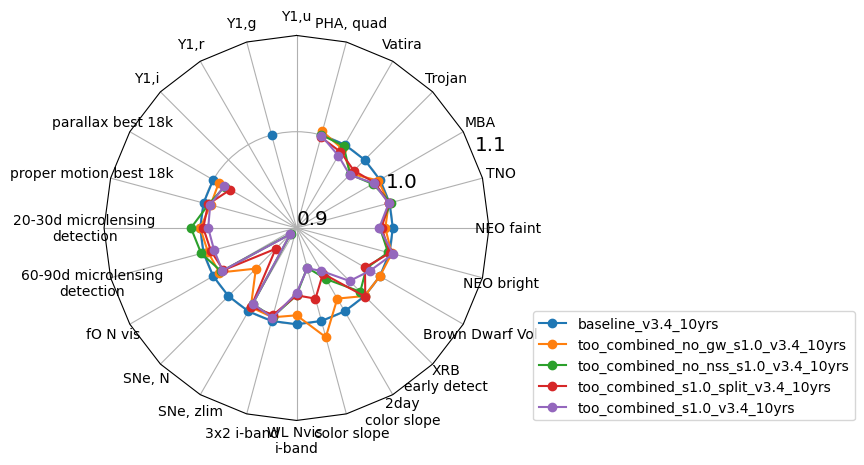

In [64]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'too_combined' in run and 's1.0' in run] #+['too_combined_s0.0_v3.4_10yrs']

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.95, 0))

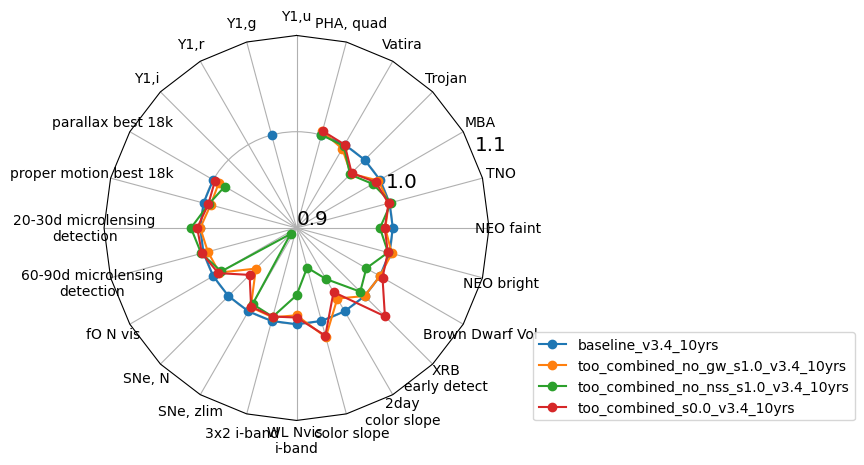

In [65]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'too_combined' in run and 'no' in run] +['too_combined_s0.0_v3.4_10yrs']

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.95, 0))

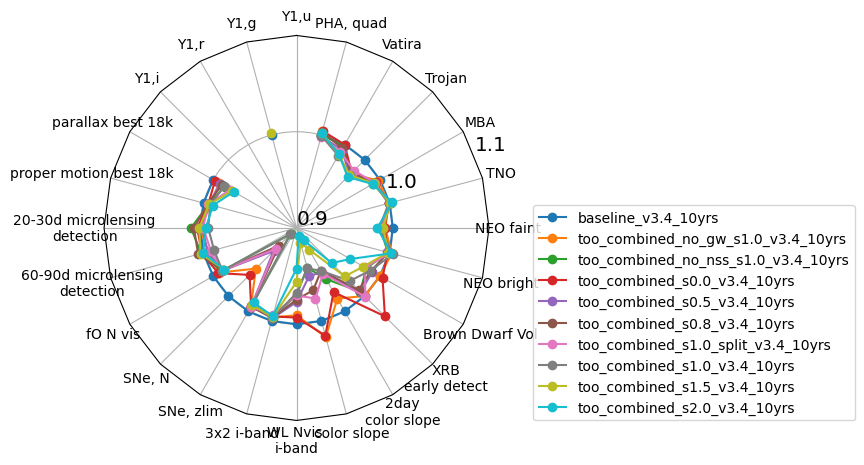

In [66]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'too_combined' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.95, 0))

In [67]:
data.loc[runs]

,"Y1,u","Y1,g","Y1,r","Y1,i",parallax best 18k,proper motion best 18k,20-30d microlensing\ndetection,60-90d microlensing\ndetection,fO N vis,"SNe, N",...,2day\ncolor slope,XRB\nearly detect,Brown Dwarf Vol,NEO bright,NEO faint,TNO,MBA,Trojan,Vatira,"PHA, quad"
baseline_v3.4_10yrs,NaN,0.992336,NaN,NaN,0.752667,0.177617,0.3653,0.5179,817.0,151098.440513,...,1559032.0,2043.0,188718.767448,0.9478,0.667858,0.727785,0.943605,0.634531,0.4634,0.904225
too_combined_no_gw_s1.0_v3.4_10yrs,NaN,NaN,NaN,NaN,0.757721,0.178973,0.3653,0.5133,811.0,145015.116570,...,1535232.0,2043.0,188727.225577,0.9502,0.660054,0.727035,0.941901,0.614364,0.4584,0.907722
too_combined_no_nss_s1.0_v3.4_10yrs,NaN,NaN,NaN,NaN,0.763271,0.178570,0.3750,0.5204,809.0,137312.088836,...,1498664.0,2030.0,185646.714944,0.9462,0.654519,0.729500,0.935035,0.613096,0.4616,0.904403
too_combined_s0.0_v3.4_10yrs,0.981564,NaN,NaN,NaN,0.754277,0.178522,0.3685,0.5197,812.0,146409.112074,...,1523004.0,2104.0,189310.614772,0.9460,0.659546,0.726705,0.938552,0.615514,0.4634,0.908165
too_combined_s0.5_v3.4_10yrs,NaN,NaN,NaN,NaN,0.759042,0.178571,0.3636,0.5132,808.0,141091.712870,...,1486465.0,2031.0,187004.190860,0.9454,0.658032,0.727287,0.936907,0.612571,0.4574,0.902955
too_combined_s0.8_v3.4_10yrs,NaN,NaN,NaN,NaN,0.760622,0.178393,0.3719,0.5237,807.0,139943.378256,...,1482798.0,2025.0,186705.883803,0.9464,0.658000,0.728253,0.937453,0.615200,0.4589,0.907600
too_combined_s1.0_split_v3.4_10yrs,NaN,NaN,NaN,NaN,0.768416,0.178476,0.3622,0.5100,807.0,140607.968804,...,1488557.0,2045.0,185348.524018,0.9482,0.656276,0.726959,0.937528,0.618806,0.4547,0.902049
too_combined_s1.0_v3.4_10yrs,NaN,NaN,NaN,NaN,0.762739,0.178901,0.3571,0.5066,808.0,137412.276388,...,1483460.0,1998.0,186552.619954,0.9518,0.653761,0.726966,0.936320,0.612620,0.4502,0.903674
too_combined_s1.5_v3.4_10yrs,NaN,0.994252,NaN,NaN,0.770291,0.178648,0.3665,0.5211,806.0,135093.667304,...,1443668.0,1984.0,184963.451152,0.9464,0.658004,0.728462,0.936062,0.612252,0.4515,0.906123
too_combined_s2.0_v3.4_10yrs,NaN,NaN,NaN,NaN,0.771715,0.179400,0.3595,0.5183,806.0,129946.316986,...,1425704.0,1944.0,182031.279599,0.9496,0.651846,0.730753,0.934875,0.609497,0.4518,0.905718


In [68]:
result = 0
for col in [col for col in data_loaded.columns if 'ToO' in col and 'Count N' in col]:
    result += data_loaded[col]

result.loc[runs]

baseline_v3.4_10yrs                   NaN
too_combined_no_gw_s1.0_v3.4_10yrs    NaN
too_combined_no_nss_s1.0_v3.4_10yrs   NaN
too_combined_s0.0_v3.4_10yrs          NaN
too_combined_s0.5_v3.4_10yrs          NaN
too_combined_s0.8_v3.4_10yrs          NaN
too_combined_s1.0_split_v3.4_10yrs    NaN
too_combined_s1.0_v3.4_10yrs          NaN
too_combined_s1.5_v3.4_10yrs          NaN
too_combined_s2.0_v3.4_10yrs          NaN
Name: Count N ToO g and note like ToO% HealpixSlicer, dtype: float64

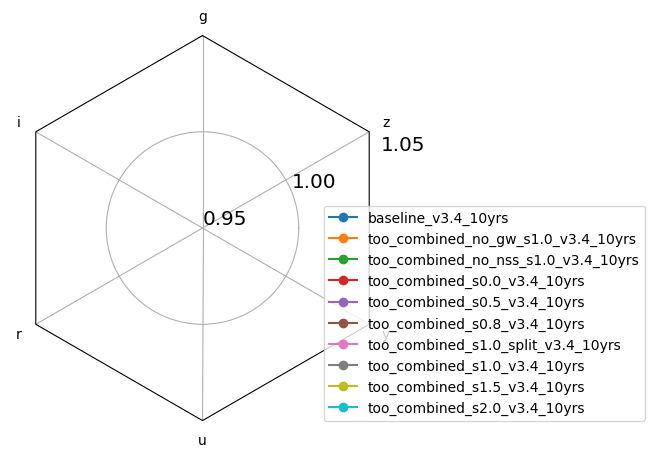

In [69]:
ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')#, invert_cols=['u', 'g', 'r', 'i', 'z', 'y'])
fig, ax = radar(ndata, legend=True, rgrids=[0.95, 1.0, 1.05], bbox_to_anchor=(1.65, 0))

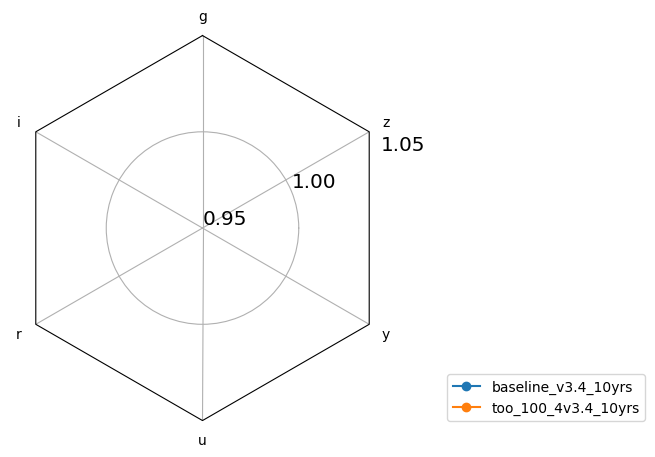

In [70]:
runs = ['baseline_v3.4_10yrs'] + ['too_100_4v3.4_10yrs'] 

ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')#, invert_cols=['u', 'g', 'r', 'i', 'z', 'y'])
fig, ax = radar(ndata, legend=True, rgrids=[0.95, 1.0, 1.05], bbox_to_anchor=(1.65, 0))

In [71]:
mag_data.loc[runs]

,g,i,r,u,y,z
baseline_v3.4_10yrs,NaN,NaN,NaN,NaN,NaN,NaN
too_100_4v3.4_10yrs,NaN,NaN,NaN,NaN,NaN,NaN


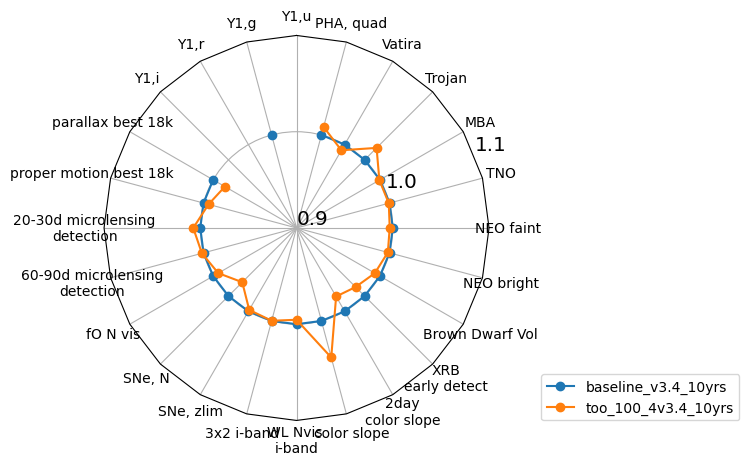

In [72]:
runs = ['baseline_v3.4_10yrs'] + ['too_100_4v3.4_10yrs'] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

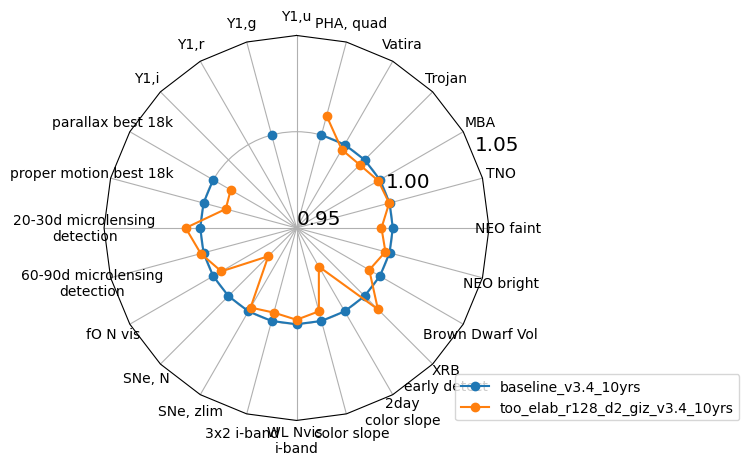

In [73]:
runs = ['baseline_v3.4_10yrs'] + ['too_elab_r128_d2_giz_v3.4_10yrs'] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.95, 1.0, 1.05], bbox_to_anchor=(1.65, 0))

In [74]:
ndata

,"Y1,u","Y1,g","Y1,r","Y1,i",parallax best 18k,proper motion best 18k,20-30d microlensing\ndetection,60-90d microlensing\ndetection,fO N vis,"SNe, N",...,2day\ncolor slope,XRB\nearly detect,Brown Dwarf Vol,NEO bright,NEO faint,TNO,MBA,Trojan,Vatira,"PHA, quad"
baseline_v3.4_10yrs,NaN,1.0,NaN,NaN,1.000000,1.000000,1.0000,1.0000,1.000000,1.000000,...,1.000000,1.00000,1.000000,1.0000,1.000000,1.000000,1.000000,1.000000,1.000,1.000000
too_elab_r128_d2_giz_v3.4_10yrs,NaN,NaN,NaN,NaN,0.989529,0.988052,1.0076,1.0015,0.995104,0.970771,...,0.973187,1.00979,0.993621,0.9978,0.994125,0.999805,0.999037,0.996413,0.997,1.010312


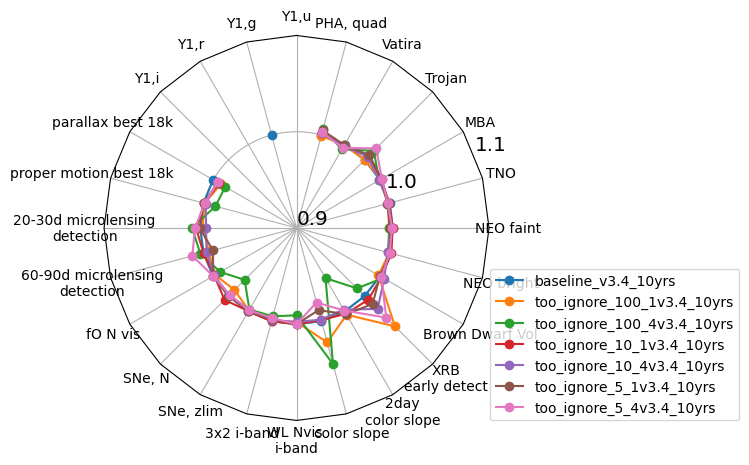

In [75]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'too' in run and 'ignore' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

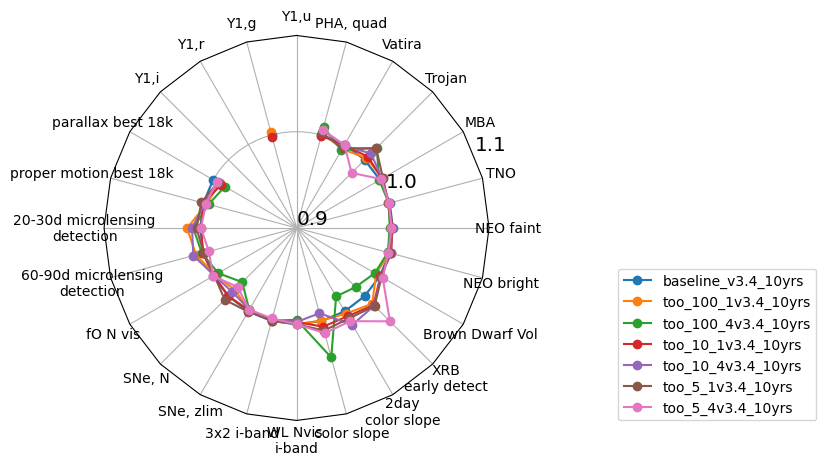

In [76]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'too_1' in run or 'too_5' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.85, 0))

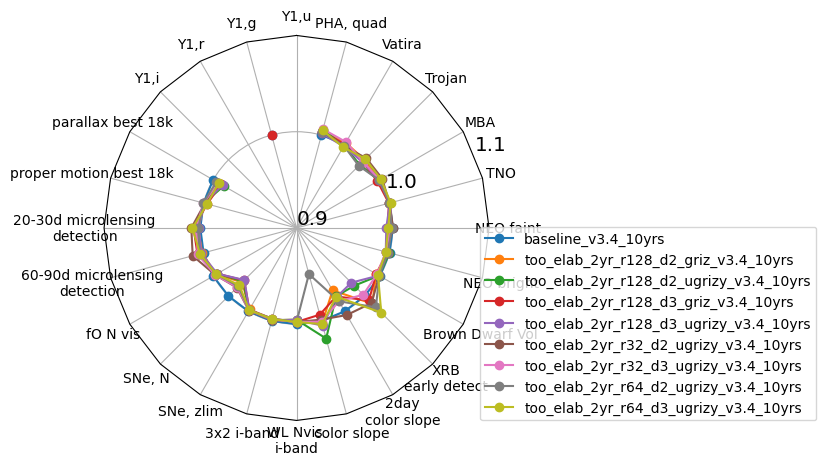

In [77]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if '2yr_' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.85, 0))

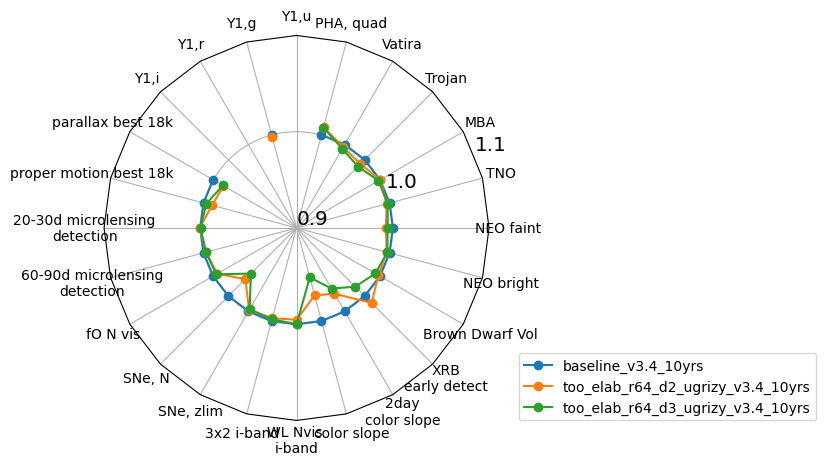

In [78]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'too_elab_r64' in run and 'ugrizy' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.85, 0))


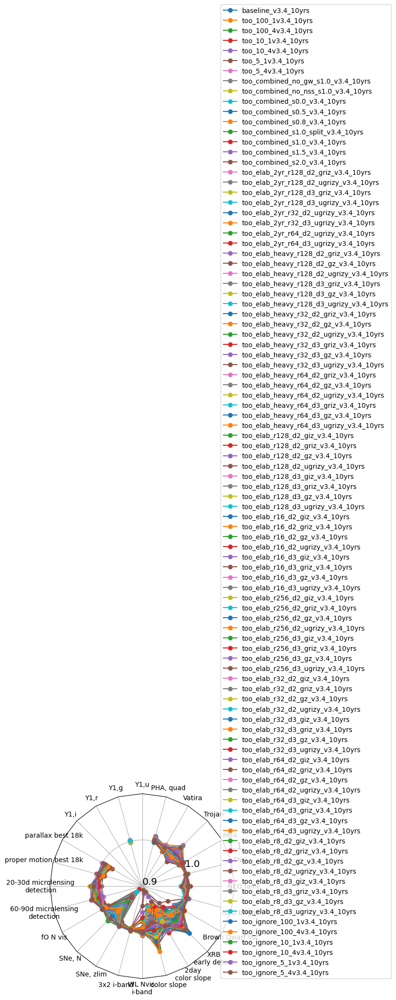

In [79]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'too_' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.85, 0))

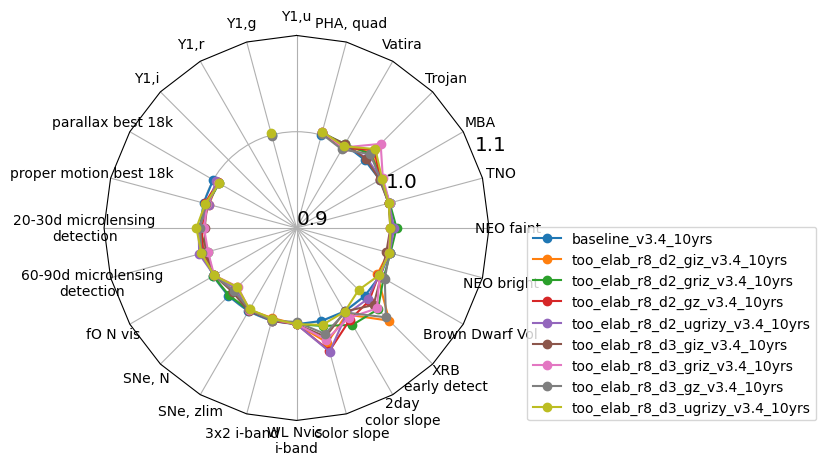

In [80]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'too_' in run and 'heavy' not in run and 'r8' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.85, 0))

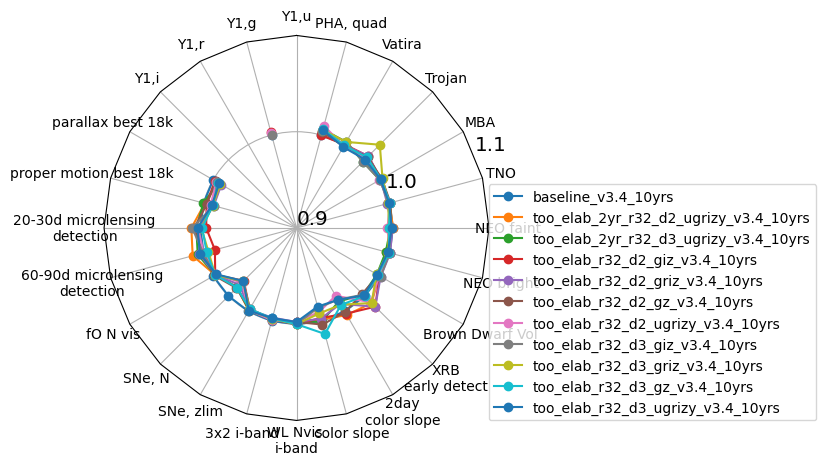

In [81]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'too_' in run and 'heavy' not in run and 'r32' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.85, 0))

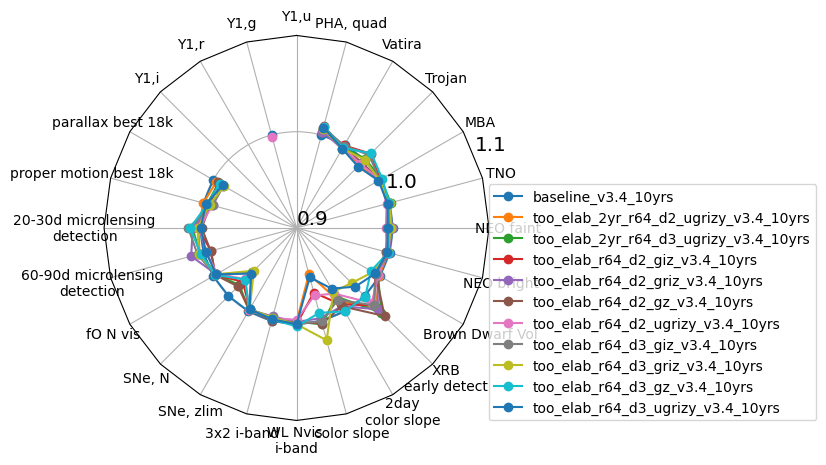

In [82]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'too_' in run and 'heavy' not in run and 'r64' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.85, 0))

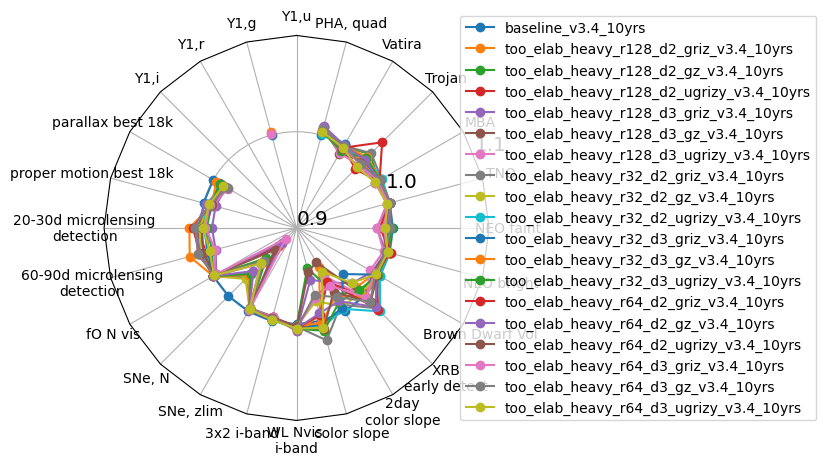

In [83]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'too_elab_heavy' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.85, 0))

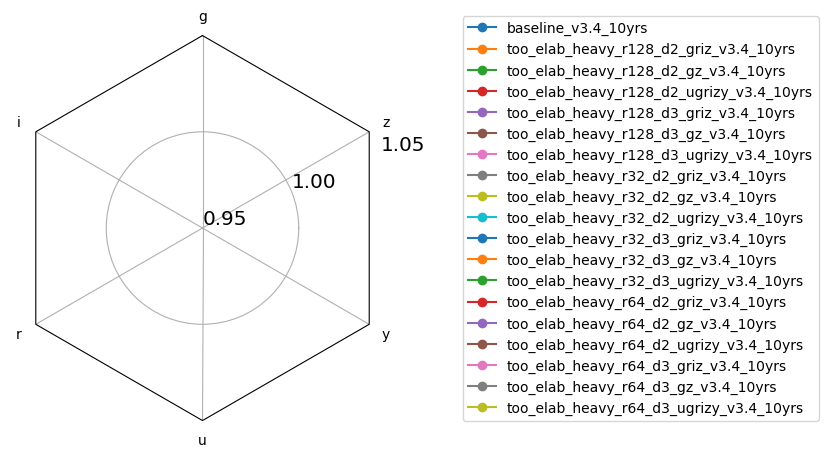

In [84]:
ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')#, invert_cols=['u', 'g', 'r', 'i', 'z', 'y'])
fig, ax = radar(ndata, legend=True, rgrids=[0.95, 1.0, 1.05], bbox_to_anchor=(2.1, 0))

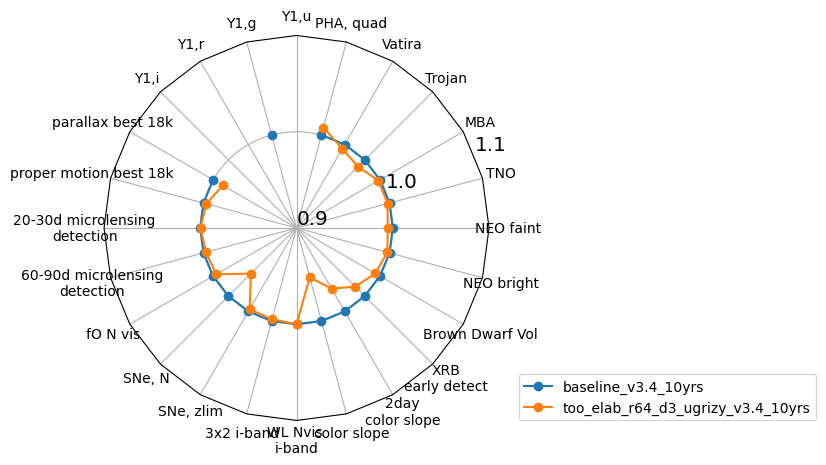

In [85]:
runs = ['baseline_v3.4_10yrs'] + ['too_elab_r64_d3_ugrizy_v3.4_10yrs'] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.85, 0))

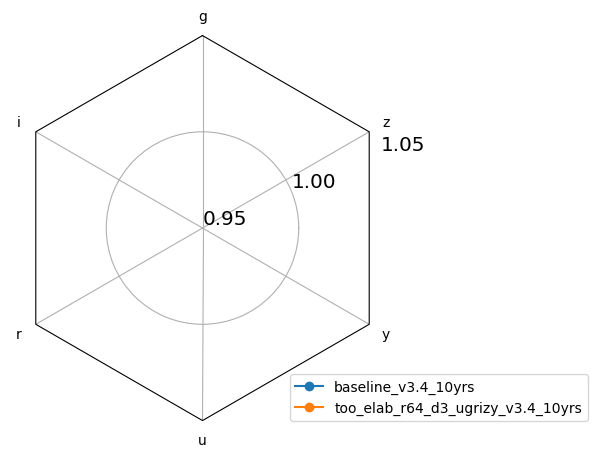

In [86]:
ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')#, invert_cols=['u', 'g', 'r', 'i', 'z', 'y'])
fig, ax = radar(ndata, legend=True, rgrids=[0.95, 1.0, 1.05], bbox_to_anchor=(1.5, 0))

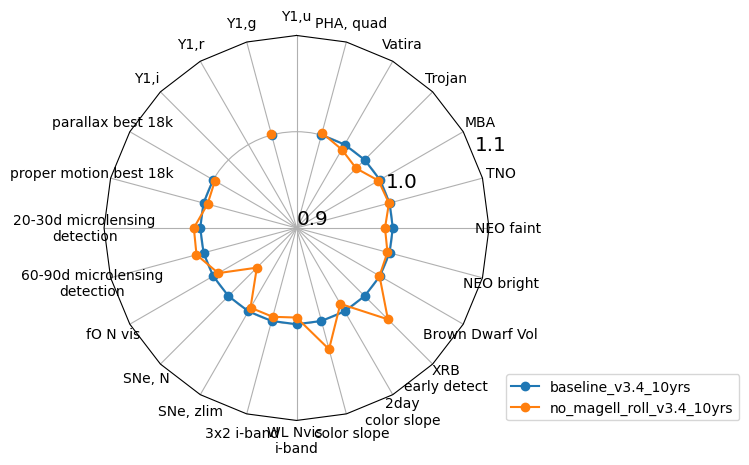

In [87]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'no_magel' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

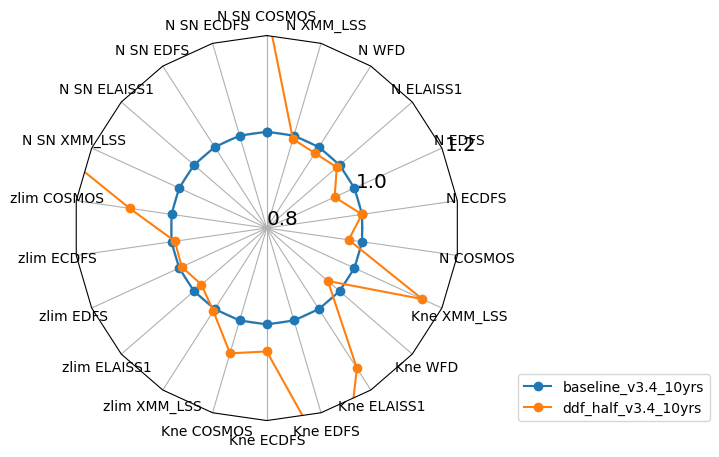

In [88]:
runs = ['baseline_v3.4_10yrs', 'ddf_half_v3.4_10yrs'] 

ndata = norm_df(ddf_data, runs, cols=ddf_data.columns.values.tolist(),
                invert_cols=None, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.8, 1.0, 1.2], bbox_to_anchor=(1.65, 0))

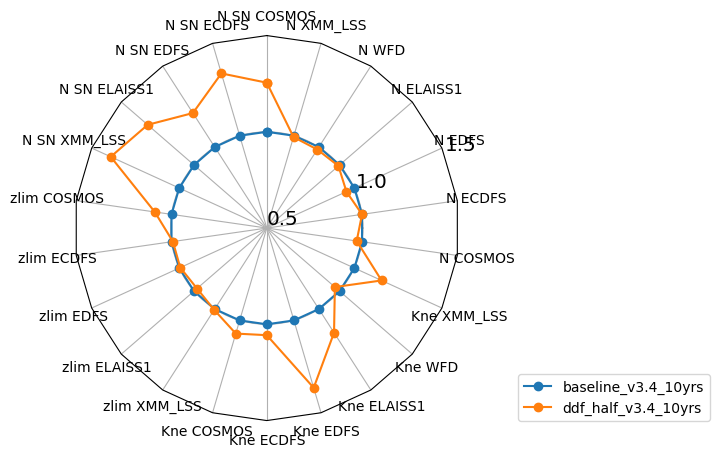

In [89]:
ndata = norm_df(ddf_data, runs, cols=ddf_data.columns.values.tolist(),
                invert_cols=None, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.5, 1.0, 1.5], bbox_to_anchor=(1.65, 0))

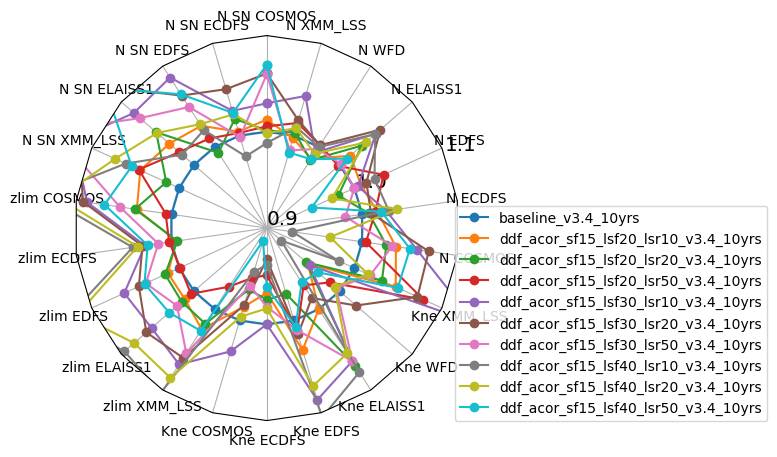

In [90]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'ddf_acor_sf15' in run and 'half' not in run]


ndata = norm_df(ddf_data, runs, cols=ddf_data.columns.values.tolist(),
                invert_cols=None, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.8, 0))

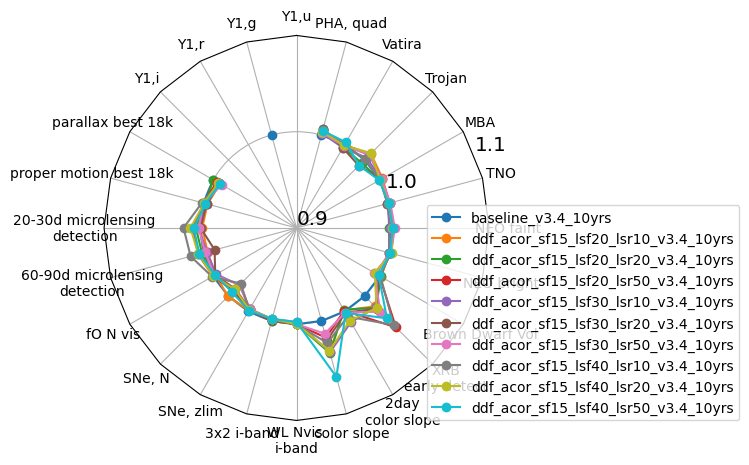

In [91]:
ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

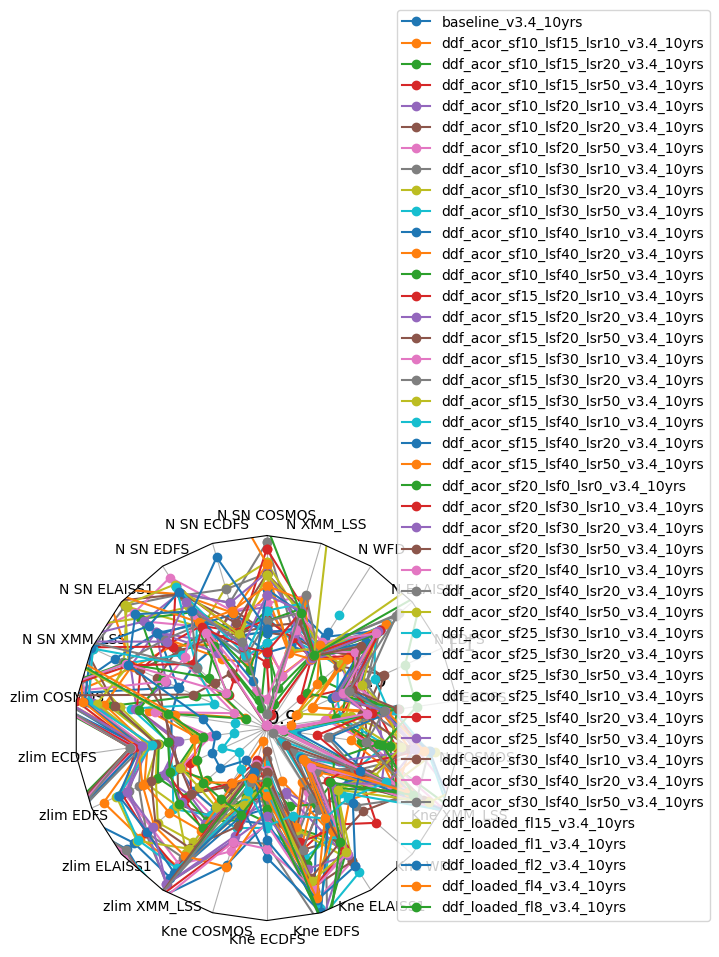

In [92]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'ddf' in run and 'half' not in run]


ndata = norm_df(ddf_data, runs, cols=ddf_data.columns.values.tolist(),
                invert_cols=None, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

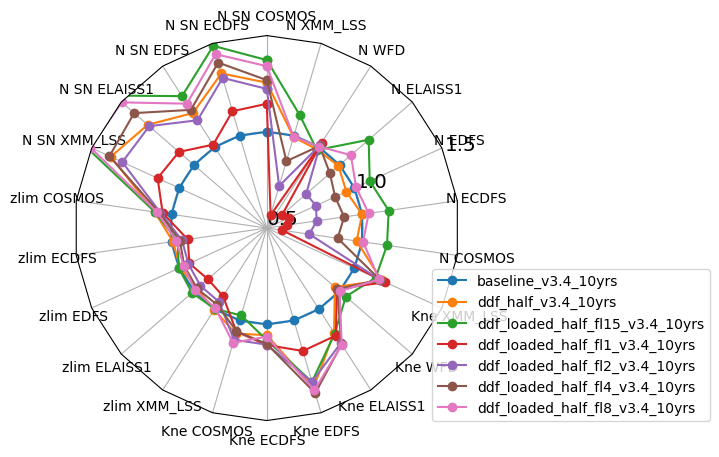

In [93]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'ddf' in run and 'half' in run]


ndata = norm_df(ddf_data, runs, cols=ddf_data.columns.values.tolist(),
                invert_cols=None, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.5, 1.0, 1.5], bbox_to_anchor=(1.65, 0))

In [94]:

sub_mag




,g,i,r,u,y,z
baseline_v3.3_10yrs,NaN,NaN,NaN,NaN,NaN,NaN
baseline_v3.4_10yrs,NaN,NaN,NaN,NaN,NaN,NaN
noroll_mjdp0_v3.4_10yrs,NaN,NaN,NaN,NaN,NaN,NaN
roll_uniform_early_half_mjdp0_v3.4_10yrs,NaN,NaN,NaN,NaN,NaN,NaN


/var/folders/jv/jdhmc2t93njct5cx375mztcr0000gn/T/ipykernel_63699/2717096801.py:8: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "s" (-> marker='s'). The keyword argument will take precedence.
  h0 = ax.errorbar(np.arange(sub_mag[col].values.size), sub_mag[col], yerr=std_mag_dict[col], fmt='s', color='k',


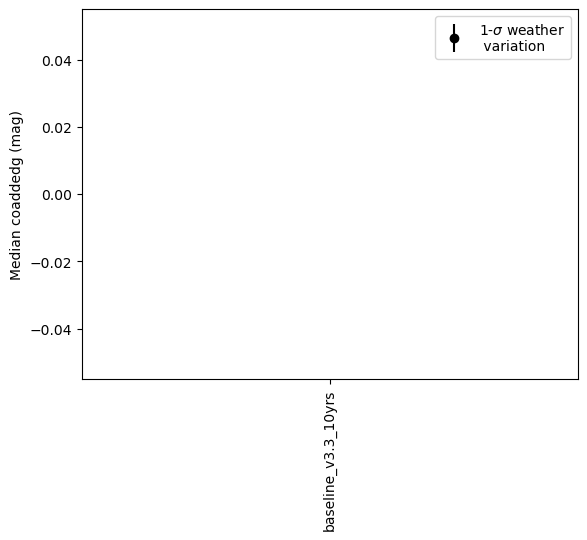

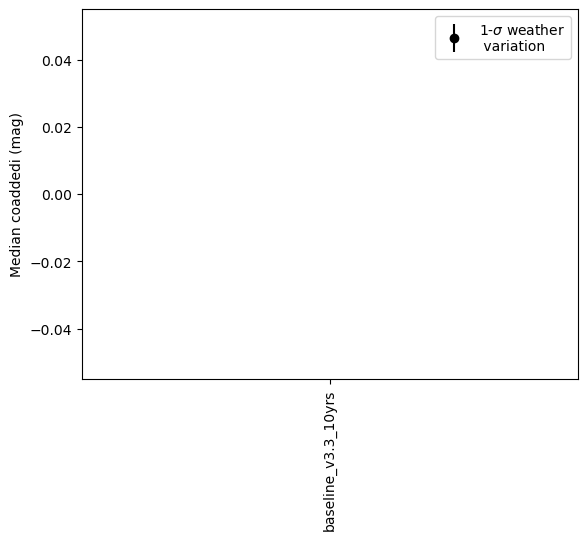

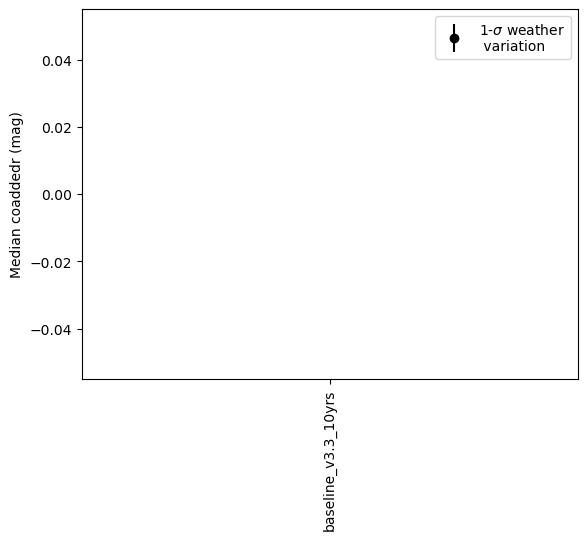

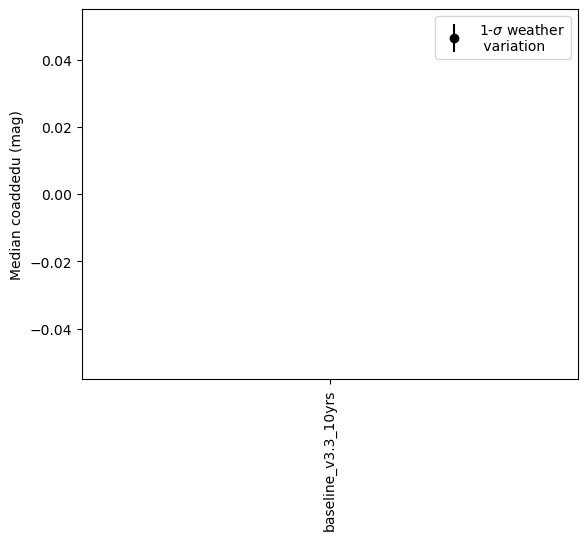

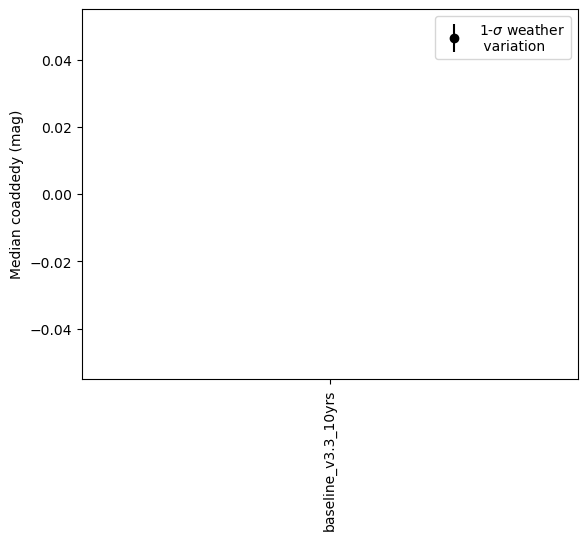

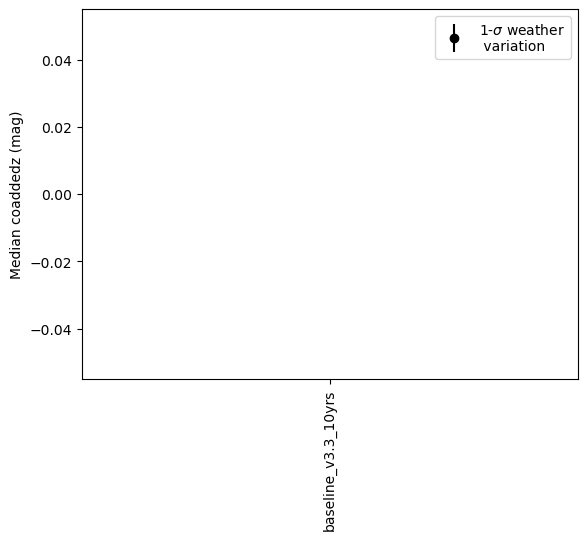

In [95]:
# Rough error bars from weather simulations

#col = data.columns[0]
for col in sub_mag.columns:
    fig, ax = plt.subplots()
    ax.plot(sub_mag[col], 'ko')
    label_add = ''
    h0 = ax.errorbar(np.arange(sub_mag[col].values.size), sub_mag[col], yerr=std_mag_dict[col], fmt='s', color='k',
               label=r'1-$\sigma$ weather'
                '\n variation', marker='o')
    
    label_add = ' (mag)'
    ax.set_ylabel('Median coadded' + col + label_add)
    ax.tick_params(axis='x', labelrotation = 90)
    hh=[h0]
    ax.legend(hh, [H.get_label() for H in hh],
        handler_map={type(h0): HandlerErrorbar(xerr_size=1)})
    if col in invert_cols:
        ax.set_ylim(ax.get_ylim()[::-1])


In [96]:
[col for col in data_loaded.columns if 'MBA' in col and 'Inversion' in col and 'H = 18.0' in col]

['FractionPop Lightcurve Inversion H = 18.000000 LightcurveInversionAsteroid MBA MoObjSlicer']

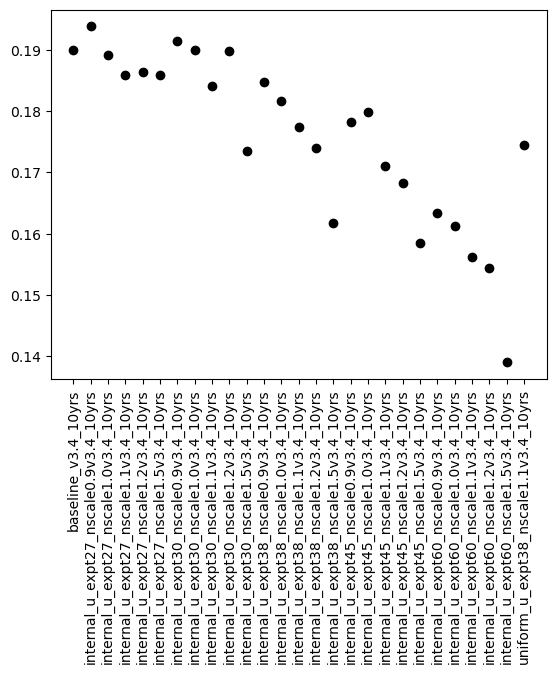

In [97]:

runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'u_exp' in run]
fig, ax = plt.subplots()
ax.plot(data_loaded['FractionPop Lightcurve Inversion H = 18.000000 LightcurveInversionAsteroid MBA MoObjSlicer'].loc[runs],
       'ko')
ax.tick_params(axis='x', labelrotation = 90)


In [98]:
[indx for indx in data_loaded.columns if 'Season' in indx and 'COSMOS' in indx]

['Mean DD:COSMOS Median Season Length all bands UniSlicer']

In [99]:
plt.plot(data_loaded['Mean DD:XMM_LSS Median Season Length all bands UserPointsSlicer'])

KeyError: 'Mean DD:XMM_LSS Median Season Length all bands UserPointsSlicer'

In [ ]:
plt.plot(data_loaded['Mean DD:COSMOS Median Season Length all bands UserPointsSlicer'])

In [ ]:
np.where(data_loaded['Mean DD:COSMOS Median Season Length all bands UserPointsSlicer'] > 190)

In [ ]:
data_loaded.index[50]

In [ ]:
# [indx for indx in data_loaded.columns if 'ToO' in indx]

In [ ]:
data_loaded['Identity Count night note like ToO, % UniSlicer']

In [ ]:

names = data_loaded.index.values[np.where(data_loaded['Identity Count night note like ToO, % UniSlicer'] > 0)[0]
]
names
rates = []
for name in data_loaded.index.values:
    if ('too_combined' not in name) & ('too_example' not in name) & ('too' in name):
        if 'too_ignore' in name:
            rates.append(int(name.split('_')[2]))
        else:
            if '_r' in name:
                rates.append(int(name.split('_r')[1].split('_')[0].replace('r', '')))
            else:
                rates.append(int(name.split('_')[1]))
    else:
        rates.append(0)

In [ ]:
fig, ax = plt.subplots()

scat = ax.scatter( data_loaded['Identity Count night note like ToO, % UniSlicer'],
         data_loaded['Total detected SNNSNMetric_reducen_sn DDF excluded HealpixSlicer'],
        c=rates)

ax.plot([0], data_loaded['Total detected SNNSNMetric_reducen_sn DDF excluded HealpixSlicer']['baseline_v3.4_10yrs'], 'ro')

ax.set_ylabel('N SNe < zlim, WFD')
ax.set_xlabel('N ToO visits')

cb = fig.colorbar(scat)
cb.set_label('ToO per year')

#locs = [name for name in data_loaded.index if 'too_1' in name or 'too_5' in name]

#ax.plot( data_loaded['Identity Count night note like ToO, % UniSlicer'].loc[locs],
#         data_loaded['Total detected SNNSNMetric_reducen_sn DDF excluded HealpixSlicer'].loc[locs],
#        'bo')

In [ ]:
fig, ax = plt.subplots()

comp = 'Median CoaddM5 g HealpixSlicer'

scat = ax.scatter( data_loaded['Identity Count night note like ToO, % UniSlicer'],
         data_loaded[comp],
        c=rates)

ax.plot([0], data_loaded[comp]['baseline_v3.4_10yrs'], 'ro')

ax.set_ylabel('Median coadded g depth (mag)')
ax.set_xlabel('N ToO visits')

cb = fig.colorbar(scat)
cb.set_label('ToO per year')


In [ ]:
fig, ax = plt.subplots()

ax.plot( data_loaded['Identity Count night note like ToO, % UniSlicer'],
         data_loaded['Total detected KNePopMetric_all_ztfrest_simple all models UserPointsSlicer']/500e3,
        'ko')

ax.plot([0], data_loaded['Total detected KNePopMetric_all_ztfrest_simple all models UserPointsSlicer']['baseline_v3.4_10yrs']/500e3, 'ro')

ax.set_ylabel('KNe ZTF simple fraction recovered')
ax.set_xlabel('N ToO visits')

In [ ]:
fig, ax = plt.subplots()

ax.plot( data_loaded['Identity Count night note like ToO, % UniSlicer'],
         data_loaded['Total detected KNePopMetric_single_ztfrest_simple single model UserPointsSlicer']/500e3,
        'ko')

ax.plot([0], data_loaded['Total detected KNePopMetric_single_ztfrest_simple single model UserPointsSlicer']['baseline_v3.4_10yrs']/500e3, 'ro')

ax.set_ylabel('KNe ZTF simple fraction recovered')
ax.set_xlabel('N ToO visits')

In [ ]:
data_loaded['Identity Count night note like ToO, % UniSlicer'].loc['too_100_4v3.4_10yrs']

In [ ]:
kne_data =  pd.read_hdf('summary_too.h5')


In [ ]:
kne_data.run_name

In [ ]:
indx = [i for i,name in enumerate(kne_data.run_name) if 'too_elab' in name and 'r64' in name and 'heavy' not in name]

In [ ]:
kne_data.iloc[indx]

In [ ]:
np.unique(kne_data.iloc[indx]["run_name"])

In [ ]:
identified = []
mean_no = []
nobs = kne_data["t1"] + kne_data["t2"] + kne_data["t4"] + kne_data["t24"] + kne_data["t48"]
for name in np.unique(kne_data.iloc[indx]["run_name"]):
    good = np.where((kne_data["run_name"].values == name) & (nobs.values > 0))[0]
    identified.append(np.mean(kne_data["presto_score_p"].values[good]))
    mean_no.append(nobs.values[good].mean())

In [ ]:
np.array(identified)

In [ ]:
mean_no

In [ ]:
fig, ax = plt.subplots()

for i, name in enumerate(np.unique(kne_data.iloc[indx]["run_name"])):

    ax.scatter(mean_no[i], identified[i], label=name.replace('too_elab_', '').replace('_v3.4_10yrs', ''))
ax.set_xlabel('Mean number of visits per ToO')
ax.set_ylabel('Fraction of ToOs classified')
ax.set_title('ToOs with some observations')
ax.legend()

In [ ]:
plt.plot(data["KNe Score, P"]/10e3, data["KNe single model"]/500e3, 'ko', alpha=.2, label='v3.4')

b_indx = np.where(data.index == 'baseline_v3.4_10yrs')[0]

plt.plot(data["KNe Score, P"].values[b_indx]/10e3, data["KNe single model"].values[b_indx]/500e3,
         'ro', label='baseline_v3.4', alpha=0.5)
plt.xlabel('KNe Score, P  (Fraction Classified)')
plt.ylabel('KNe single model (Fraction Classified)')
plt.title('v3.4 runs + previous baselines')

runs = [run for run in data.index if 'uniform' in run and 'half' not in run] 

plt.plot(data["KNe Score, P"].loc[runs]/10e3, data["KNe single model"].loc[runs]/500e3,
         'bo', label='uniform rolling', alpha=0.5)

runs = [run for run in data.index if 'v3.4' not in run ] 

plt.plot(data["KNe Score, P"].loc[runs]/10e3, data["KNe single model"].loc[runs]/500e3,
         'yo', label='Previous Baselines', alpha=0.5)

runs = [run for run in data.index if 'v3.3' in run ] 

plt.plot(data["KNe Score, P"].loc[runs]/10e3, data["KNe single model"].loc[runs]/500e3,
         'go', label='baseline_v3.3', alpha=0.5)

leg = plt.legend()

In [ ]:
data["KNe Score, S"] = data_loaded["Sum PrestoKNe_score_s UserPointsSlicer"]

plt.plot(data["KNe Score, S"], data["KNe single model"]/500e3, 'ko', alpha=.2, label='v3.4')

b_indx = np.where(data.index == 'baseline_v3.4_10yrs')[0]

plt.plot(data["KNe Score, S"].values[b_indx], data["KNe single model"].values[b_indx]/500e3,
         'ro', label='baseline_v3.4', alpha=0.5)
plt.xlabel('KNe Score, S')
plt.ylabel('KNe single model')
plt.title('v3.4 runs + previous baselines')

runs = [run for run in data.index if 'uniform' in run and 'half' not in run] 

plt.plot(data["KNe Score, S"].loc[runs], data["KNe single model"].loc[runs]/500e3,
         'bo', label='uniform rolling', alpha=0.5)

runs = [run for run in data.index if 'v3.4' not in run ] 

plt.plot(data["KNe Score, S"].loc[runs], data["KNe single model"].loc[runs]/500e3,
         'yo', label='Previous Baselines', alpha=0.5)

runs = [run for run in data.index if 'v3.3' in run ] 

plt.plot(data["KNe Score, S"].loc[runs], data["KNe single model"].loc[runs]/500e3,
         'go', label='baseline_v3.3', alpha=0.5)

leg = plt.legend()

In [ ]:
data["KNe Score, P"].loc['no_long_v3.4_10yrs'], data["KNe Score, P"].loc['baseline_v3.4_10yrs']

In [ ]:
indx = np.where(data["KNe single model"]/500e3 < .011) 
indx = np.where(data["KNe Score, P"] < 220) 

data_loaded.index[indx]

In [ ]:
from scipy.stats import pearsonr


In [ ]:
good = np.isfinite(data["KNe Score, P"]*data["KNe single model"])
pearsonr(data["KNe Score, P"].values[good], data["KNe single model"].values[good])

In [ ]:
good = np.isfinite(data["KNe ZTF simple"]*data["KNe single model"])
pearsonr(data["KNe ZTF simple"].values[good], data["KNe single model"].values[good])

In [ ]:
data_loaded['Identity Counts_long UniSlicer'].loc['baseline_v3.0_10yrs']

In [ ]:
data_loaded['Sum ColorSlope visitExposureTime > 19 HealpixSlicer'].loc['baseline_v3.4_10yrs']

In [ ]:
data_loaded['Sum ColorSlope visitExposureTime > 19 HealpixSlicer'].loc['no_long_v3.4_10yrs']

In [ ]:
data_loaded['Sum ColorSlope visitExposureTime > 19 HealpixSlicer'].loc['all_long_v3.4_10yrs']

In [ ]:
data_loaded['Sum ColorSlope visitExposureTime > 19 HealpixSlicer'].loc['roll_uniform_mjdp0_v3.4_10yrs']

In [ ]:
data_loaded['Sum ColorSlope2Night visitExposureTime > 19 HealpixSlicer'].loc['baseline_v3.4_10yrs']

In [ ]:
data_loaded['Sum ColorSlope2Night visitExposureTime > 19 HealpixSlicer'].loc['noroll_mjdp0_v3.4_10yrs']

In [ ]:
data_loaded['Sum ColorSlope2Night visitExposureTime > 19 HealpixSlicer'].loc['roll_uniform_mjdp180_v3.4_10yrs']

In [ ]:
runs = [run for run in data.index if 'uniform' in run and 'half' not in run] 
ack = data_loaded['Sum ColorSlope2Night visitExposureTime > 19 HealpixSlicer'].loc[runs]
(ack.max() - ack.min())/ack.max()

In [ ]:
[col for col in data_loaded.columns if "gaps" in col]

In [ ]:
plt.plot(data_loaded["Mean N gaps in r at 3hr in top 18k Gaps_3hr r band HealpixSlicer"])

In [ ]:
plt.plot(data_loaded["Mean N gaps in g at 3hr in top 18k Gaps_3hr g band HealpixSlicer"], 
         data_loaded["Mean N gaps in g at 24hr in top 18k Gaps_24hr g band HealpixSlicer"], 'ko')